<div class="alert alert-block alert-info">
<h1> Analyse MTBLS1295 peak table</h1>
</div>

---
# Table of contents
- [0 - Import modules](#0---Import-modules)
- [0 - Import data](#0---Import-data)
  - [Below are all the peak tables each batch of the MLBLS19 dataset](#Below-are-all-the-peak-tables-each-batch-of-the-MLBLS19-dataset)
- [1 - Preprocess data](#1---Preprocess-data)
  - [a - Transform data to adapt with input requirements](#a---Transform-data-to-adapt-with-input-requirements)
- [2 - Explore data](#2---Explore-data)
  - [a - Feature types](#a---Feature-types)
  - [b - Missing values exploration](#b---Missing-values-exploration)
  - [c - Correlation between features](#c---Correlation-between-features)
  - [d - Remove strongly correlated features (to potentially avoid issues during further analysis)](#d---Remove-strongly-correlated-features-(to-potentially-avoid-issues-during-further-analysis))
  - [e - PCA](#e---PCA)
  - [f - Target visualisation](#f---Target-visualisation)
  - [g - Feature visualisation](#g---Feature-visualisation)
- [3 - Impute missing values](#3---Impute-missing-values)
  - [a - Impute intensities with half minimum value in features](#a---Impute-intensities-with-half-minimum-value-in-features)
  - [b - PCA](#b---PCA)
- [4 - Transformations](#4---Transformations)
  - [a - log transformation](#a---log-transformation)
  - [b - Standard scale intensities](#b---Standard-scale-intensities)
- [5 - Dimensionality reduction](#5---Dimensionality-reduction)
  - [a - PCA then t-SNE](#a---PCA-then-t-SNE)
  - [b - Feature selection keeping all features with ANOVA pvalue $\lt \alpha \hspace{0.39cm}$](#b---Feature-selection-keeping-all-features-with-ANOVA-pvalue-$\lt-\alpha-\hspace{0.39cm}$)
  - [c - Feature selection keeping a specific number of features](#c---Feature-selection-keeping-a-specific-number-of-features)
- [6 - Classification](#6---Classification)
  - [a - Launch pipeline with differently preprocessed dataframes](#a---Launch-pipeline-with-differently-preprocessed-dataframes)
- [7 - Clustering](#7---Clustering)
  - [a - Kmeans](#a---Kmeans)
  - [b - Affinity propagation](#b---Affinity-propagation)
  - [c - Hierarchical clustering](#c---Hierarchical-clustering)
---

# 0 - Import modules

In [65]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import random
import os
import cimcb_lite as cb

In [2]:
import re
pwd = ! pwd
pwd = re.sub('notebooks/', '', pwd[0])
pwd = '/'.join(pwd.split('/')[:-1]) + '/'
print(f'Working directory : {pwd}')

python_version = ! python --version
print(f'Python version : {python_version[0]}')

Working directory : /home/jovyan/work/
Python version : Python 3.10.4


In [3]:
# Tune the visual settings for figures in seaborn
sns.set_context(
    "notebook", font_scale=1.2, rc={"figure.figsize": (15,8), "axes.titlesize": 15}
)

from matplotlib import rcParams

rcParams["figure.figsize"] = 15, 8

sns.set_theme(style="darkgrid")

In [4]:
import sys
sys.path.append(pwd + 'bin/')

# 0 - Import data

## Below are all the peak tables each batch of the MLBLS19 dataset

In [5]:
peakTable_init = pd.read_excel(pwd + 'data/MTBLS1295/BileAcid.xlsx')
print(f'Peak table shape : {peakTable_init.shape}')
peakTable_init.head()

Peak table shape : (96, 54)


,unit: nmol/g,Category,primary,primary.1,primary.2,primary.3,primary.4,primary.5,primary conjugated,primary conjugated.1,...,secondary conjugated.12,Unnamed: 45,Unnamed: 46,Unnamed: 47,Unnamed: 48,Unnamed: 49,Unnamed: 50,Unnamed: 51,Unnamed: 52,Unnamed: 53
0,sample,BAs,a-MCA,ACA,b-MCA,CA,CDCA,HCA,GCA,GCDCA,...,TUDCA,CA:CDCA,DCA:CA,GDCA:CA,TDCA:CA,LCA:CDCA,GLCA:CDCA,TLCA:CDCA,GDCA:DCA,TDCA:DCA
1,HCL-11,HC,0.473369,28.321693,39.173192,1310.431746,121.319929,18.143915,50.288536,5.322751,...,83.363668,10.801455,0.127721,0,0.000046,0.004605,0.000151,0.000023,0,0.000358
2,HCL-9,HC,59.614194,57.979355,26.272258,3348.52,245.130323,59.877419,21.92,1.776774,...,0.682581,13.660162,0.091134,0.000015,0.000012,0.000342,0.000153,0.000179,0.000161,0.000131
3,HCL-10,HC,8.676522,6.44087,1.528696,404.870435,90.94,10.99913,0.324348,0.436522,...,0.275652,4.452061,0.287106,0,0.000017,0.02664,0.000115,0.000096,0,0.00006
4,HCL-1,HC,2.984348,21.568696,8.652754,1341.371594,389.247536,10.369855,4.687536,1.503768,...,0.038261,3.446063,0.000717,0.000015,0.000027,0.000298,0.000057,0,0.020507,0.037394


In [6]:
all_metadata = pd.read_csv(pwd + 'data/MTBLS1295/s_MTBLS1295.txt', sep='\t')
print(f'Metadata shape : {all_metadata.shape}')
all_metadata.head()

Metadata shape : (96, 15)


,Source Name,Characteristics[Organism],Term Source REF,Term Accession Number,Characteristics[Organism part],Term Source REF.1,Term Accession Number.1,Factor Value[Disease],Term Source REF.2,Term Accession Number.2,Protocol REF,Sample Name,Factor Value[BioSamples accession],Term Source REF.3,Term Accession Number.3
0,CH-01,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,Feces,NCIT,http://purl.obolibrary.org/obo/NCIT_C13234,Cholestasis,DOID,http://purl.obolibrary.org/obo/DOID_13580,Sample collection,CH-01,SAMEA5815372,NaN,NaN
1,CH-02,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,Feces,NCIT,http://purl.obolibrary.org/obo/NCIT_C13234,Cholestasis,DOID,http://purl.obolibrary.org/obo/DOID_13580,Sample collection,CH-02,SAMEA5815369,NaN,NaN
2,CH-03,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,Feces,NCIT,http://purl.obolibrary.org/obo/NCIT_C13234,Impaired hepatic function,MTBLS,http://www.ebi.ac.uk/metabolights/ontology/pla...,Sample collection,CH-03,SAMEA5815317,NaN,NaN
3,CH-04,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,Feces,NCIT,http://purl.obolibrary.org/obo/NCIT_C13234,Cholestasis,DOID,http://purl.obolibrary.org/obo/DOID_13580,Sample collection,CH-04,SAMEA5815371,NaN,NaN
4,CH-05,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,Feces,NCIT,http://purl.obolibrary.org/obo/NCIT_C13234,Cholestasis,DOID,http://purl.obolibrary.org/obo/DOID_13580,Sample collection,CH-05,SAMEA5815367,NaN,NaN


### Below we will keep onky useful metadata

# 1 - Preprocess data

In [7]:
from explore_data_functions import *

## a - Transform data to adapt with input requirements

In [8]:
peakTable = peakTable_init.copy()
peakTable.columns = peakTable.iloc[0, :]
peakTable = peakTable.drop(0, axis=0)
peakTable.index = range(peakTable.shape[0])
peakTable

,sample,BAs,a-MCA,ACA,b-MCA,CA,CDCA,HCA,GCA,GCDCA,...,TUDCA,CA:CDCA,DCA:CA,GDCA:CA,TDCA:CA,LCA:CDCA,GLCA:CDCA,TLCA:CDCA,GDCA:DCA,TDCA:DCA
0,HCL-11,HC,0.473369,28.321693,39.173192,1310.431746,121.319929,18.143915,50.288536,5.322751,...,83.363668,10.801455,0.127721,0,0.000046,0.004605,0.000151,0.000023,0,0.000358
1,HCL-9,HC,59.614194,57.979355,26.272258,3348.52,245.130323,59.877419,21.92,1.776774,...,0.682581,13.660162,0.091134,0.000015,0.000012,0.000342,0.000153,0.000179,0.000161,0.000131
2,HCL-10,HC,8.676522,6.44087,1.528696,404.870435,90.94,10.99913,0.324348,0.436522,...,0.275652,4.452061,0.287106,0,0.000017,0.02664,0.000115,0.000096,0,0.00006
3,HCL-1,HC,2.984348,21.568696,8.652754,1341.371594,389.247536,10.369855,4.687536,1.503768,...,0.038261,3.446063,0.000717,0.000015,0.000027,0.000298,0.000057,0,0.020507,0.037394
4,HCL-12,HC,15.832258,4.008065,7.782258,319.579032,35.891935,15.341129,0.439516,0.312097,...,0.03871,8.903923,0.135763,0,0.000028,0.042579,0.000157,0,0,0.000204
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90,CH-88,CJ,0.473387,0.542742,0.025806,15.682258,12.360484,0.403226,0.004839,0.050806,...,0.014516,1.268741,0.853492,0.002211,0.001131,0.026032,0.001892,0,0.002591,0.001326
91,CH-92,CJ,0.118072,0.756627,0.044177,96.975904,54.880321,1.232932,0.011245,0.008835,...,0.00241,1.767043,0.632956,0.000282,0.000174,0.001742,0.000424,0,0.000445,0.000275
92,CH-89,CJ,3.066013,0.422876,0.037255,46.444444,62.852941,0.421569,0.888889,3.512418,...,0.043791,0.738938,1.546032,0.000394,0.000296,0.001549,0.000218,0.000042,0.000255,0.000191
93,CH-95-1,CJ,5.37006,0.877844,1.588024,293.049102,129.834731,2.943713,0.566467,0.950898,...,5.582036,2.257093,0.511173,0.000094,0.013711,0.001568,0.000175,0.000138,0.000184,0.026822


In [9]:
all_metadata_subset = all_metadata[all_metadata['Source Name'].isin(peakTable['sample'])]
print(f'Metadata shape : {all_metadata_subset.shape}')
all_metadata_subset.head()

Metadata shape : (95, 15)


,Source Name,Characteristics[Organism],Term Source REF,Term Accession Number,Characteristics[Organism part],Term Source REF.1,Term Accession Number.1,Factor Value[Disease],Term Source REF.2,Term Accession Number.2,Protocol REF,Sample Name,Factor Value[BioSamples accession],Term Source REF.3,Term Accession Number.3
0,CH-01,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,Feces,NCIT,http://purl.obolibrary.org/obo/NCIT_C13234,Cholestasis,DOID,http://purl.obolibrary.org/obo/DOID_13580,Sample collection,CH-01,SAMEA5815372,NaN,NaN
1,CH-02,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,Feces,NCIT,http://purl.obolibrary.org/obo/NCIT_C13234,Cholestasis,DOID,http://purl.obolibrary.org/obo/DOID_13580,Sample collection,CH-02,SAMEA5815369,NaN,NaN
2,CH-03,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,Feces,NCIT,http://purl.obolibrary.org/obo/NCIT_C13234,Impaired hepatic function,MTBLS,http://www.ebi.ac.uk/metabolights/ontology/pla...,Sample collection,CH-03,SAMEA5815317,NaN,NaN
3,CH-04,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,Feces,NCIT,http://purl.obolibrary.org/obo/NCIT_C13234,Cholestasis,DOID,http://purl.obolibrary.org/obo/DOID_13580,Sample collection,CH-04,SAMEA5815371,NaN,NaN
4,CH-05,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,Feces,NCIT,http://purl.obolibrary.org/obo/NCIT_C13234,Cholestasis,DOID,http://purl.obolibrary.org/obo/DOID_13580,Sample collection,CH-05,SAMEA5815367,NaN,NaN


### Separate intensities (in dataframe <code>X</code>) and metadata (in dataframe <code>metadata</code>)

In [10]:
X = peakTable.iloc[:, 2:]
X

,a-MCA,ACA,b-MCA,CA,CDCA,HCA,GCA,GCDCA,GHCA,T-b-MCA,...,TUDCA,CA:CDCA,DCA:CA,GDCA:CA,TDCA:CA,LCA:CDCA,GLCA:CDCA,TLCA:CDCA,GDCA:DCA,TDCA:DCA
0,0.473369,28.321693,39.173192,1310.431746,121.319929,18.143915,50.288536,5.322751,0.395767,2.605996,...,83.363668,10.801455,0.127721,0,0.000046,0.004605,0.000151,0.000023,0,0.000358
1,59.614194,57.979355,26.272258,3348.52,245.130323,59.877419,21.92,1.776774,0.251613,3.547097,...,0.682581,13.660162,0.091134,0.000015,0.000012,0.000342,0.000153,0.000179,0.000161,0.000131
2,8.676522,6.44087,1.528696,404.870435,90.94,10.99913,0.324348,0.436522,0.038261,0.025217,...,0.275652,4.452061,0.287106,0,0.000017,0.02664,0.000115,0.000096,0,0.00006
3,2.984348,21.568696,8.652754,1341.371594,389.247536,10.369855,4.687536,1.503768,0.026667,0.197101,...,0.038261,3.446063,0.000717,0.000015,0.000027,0.000298,0.000057,0,0.020507,0.037394
4,15.832258,4.008065,7.782258,319.579032,35.891935,15.341129,0.439516,0.312097,0.033065,0,...,0.03871,8.903923,0.135763,0,0.000028,0.042579,0.000157,0,0,0.000204
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90,0.473387,0.542742,0.025806,15.682258,12.360484,0.403226,0.004839,0.050806,0,0.071774,...,0.014516,1.268741,0.853492,0.002211,0.001131,0.026032,0.001892,0,0.002591,0.001326
91,0.118072,0.756627,0.044177,96.975904,54.880321,1.232932,0.011245,0.008835,0,0.053815,...,0.00241,1.767043,0.632956,0.000282,0.000174,0.001742,0.000424,0,0.000445,0.000275
92,3.066013,0.422876,0.037255,46.444444,62.852941,0.421569,0.888889,3.512418,0.015033,0.124837,...,0.043791,0.738938,1.546032,0.000394,0.000296,0.001549,0.000218,0.000042,0.000255,0.000191
93,5.37006,0.877844,1.588024,293.049102,129.834731,2.943713,0.566467,0.950898,0,0.250299,...,5.582036,2.257093,0.511173,0.000094,0.013711,0.001568,0.000175,0.000138,0.000184,0.026822


In [11]:
metadata = peakTable.drop(X.columns, axis=1)
metadata

,sample,BAs
0,HCL-11,HC
1,HCL-9,HC
2,HCL-10,HC
3,HCL-1,HC
4,HCL-12,HC
...,...,...
90,CH-88,CJ
91,CH-92,CJ
92,CH-89,CJ
93,CH-95-1,CJ


### Set target feature

In [12]:
target = peakTable['BAs']
target

0     HC
1     HC
2     HC
3     HC
4     HC
      ..
90    CJ
91    CJ
92    CJ
93    CJ
94    CJ
Name: BAs, Length: 95, dtype: object

# 2 - Explore data

## a - Feature types

######################################################################################################################################################
Data types : 
object    54
dtype: int64



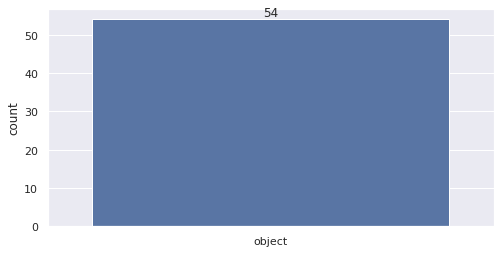

######################################################################################################################################################


In [13]:
plot_feature_types(peakTable)

### For further analysis, we prefer peak table intensites as float

In [14]:
peakTable[peakTable.columns[2:]] = peakTable[peakTable.columns[2:]].apply(pd.to_numeric, errors='coerce', axis=1)
peakTable

,sample,BAs,a-MCA,ACA,b-MCA,CA,CDCA,HCA,GCA,GCDCA,...,TUDCA,CA:CDCA,DCA:CA,GDCA:CA,TDCA:CA,LCA:CDCA,GLCA:CDCA,TLCA:CDCA,GDCA:DCA,TDCA:DCA
0,HCL-11,HC,0.473369,28.321693,39.173192,1310.431746,121.319929,18.143915,50.288536,5.322751,...,83.363668,10.801455,0.127721,0.000000,0.000046,0.004605,0.000151,0.000023,0.000000,0.000358
1,HCL-9,HC,59.614194,57.979355,26.272258,3348.520000,245.130323,59.877419,21.920000,1.776774,...,0.682581,13.660162,0.091134,0.000015,0.000012,0.000342,0.000153,0.000179,0.000161,0.000131
2,HCL-10,HC,8.676522,6.440870,1.528696,404.870435,90.940000,10.999130,0.324348,0.436522,...,0.275652,4.452061,0.287106,0.000000,0.000017,0.026640,0.000115,0.000096,0.000000,0.000060
3,HCL-1,HC,2.984348,21.568696,8.652754,1341.371594,389.247536,10.369855,4.687536,1.503768,...,0.038261,3.446063,0.000717,0.000015,0.000027,0.000298,0.000057,0.000000,0.020507,0.037394
4,HCL-12,HC,15.832258,4.008065,7.782258,319.579032,35.891935,15.341129,0.439516,0.312097,...,0.038710,8.903923,0.135763,0.000000,0.000028,0.042579,0.000157,0.000000,0.000000,0.000204
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90,CH-88,CJ,0.473387,0.542742,0.025806,15.682258,12.360484,0.403226,0.004839,0.050806,...,0.014516,1.268741,0.853492,0.002211,0.001131,0.026032,0.001892,0.000000,0.002591,0.001326
91,CH-92,CJ,0.118072,0.756627,0.044177,96.975904,54.880321,1.232932,0.011245,0.008835,...,0.002410,1.767043,0.632956,0.000282,0.000174,0.001742,0.000424,0.000000,0.000445,0.000275
92,CH-89,CJ,3.066013,0.422876,0.037255,46.444444,62.852941,0.421569,0.888889,3.512418,...,0.043791,0.738938,1.546032,0.000394,0.000296,0.001549,0.000218,0.000042,0.000255,0.000191
93,CH-95-1,CJ,5.370060,0.877844,1.588024,293.049102,129.834731,2.943713,0.566467,0.950898,...,5.582036,2.257093,0.511173,0.000094,0.013711,0.001568,0.000175,0.000138,0.000184,0.026822


######################################################################################################################################################
Data types : 
float64    52
object      2
dtype: int64



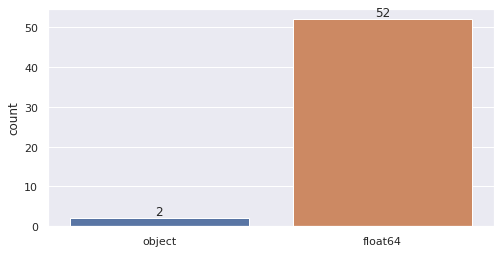

######################################################################################################################################################


In [15]:
plot_feature_types(peakTable)

### Re-subset X to have numerical values instead of object

In [16]:
X = peakTable.iloc[:, 2:]
X

,a-MCA,ACA,b-MCA,CA,CDCA,HCA,GCA,GCDCA,GHCA,T-b-MCA,...,TUDCA,CA:CDCA,DCA:CA,GDCA:CA,TDCA:CA,LCA:CDCA,GLCA:CDCA,TLCA:CDCA,GDCA:DCA,TDCA:DCA
0,0.473369,28.321693,39.173192,1310.431746,121.319929,18.143915,50.288536,5.322751,0.395767,2.605996,...,83.363668,10.801455,0.127721,0.000000,0.000046,0.004605,0.000151,0.000023,0.000000,0.000358
1,59.614194,57.979355,26.272258,3348.520000,245.130323,59.877419,21.920000,1.776774,0.251613,3.547097,...,0.682581,13.660162,0.091134,0.000015,0.000012,0.000342,0.000153,0.000179,0.000161,0.000131
2,8.676522,6.440870,1.528696,404.870435,90.940000,10.999130,0.324348,0.436522,0.038261,0.025217,...,0.275652,4.452061,0.287106,0.000000,0.000017,0.026640,0.000115,0.000096,0.000000,0.000060
3,2.984348,21.568696,8.652754,1341.371594,389.247536,10.369855,4.687536,1.503768,0.026667,0.197101,...,0.038261,3.446063,0.000717,0.000015,0.000027,0.000298,0.000057,0.000000,0.020507,0.037394
4,15.832258,4.008065,7.782258,319.579032,35.891935,15.341129,0.439516,0.312097,0.033065,0.000000,...,0.038710,8.903923,0.135763,0.000000,0.000028,0.042579,0.000157,0.000000,0.000000,0.000204
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90,0.473387,0.542742,0.025806,15.682258,12.360484,0.403226,0.004839,0.050806,0.000000,0.071774,...,0.014516,1.268741,0.853492,0.002211,0.001131,0.026032,0.001892,0.000000,0.002591,0.001326
91,0.118072,0.756627,0.044177,96.975904,54.880321,1.232932,0.011245,0.008835,0.000000,0.053815,...,0.002410,1.767043,0.632956,0.000282,0.000174,0.001742,0.000424,0.000000,0.000445,0.000275
92,3.066013,0.422876,0.037255,46.444444,62.852941,0.421569,0.888889,3.512418,0.015033,0.124837,...,0.043791,0.738938,1.546032,0.000394,0.000296,0.001549,0.000218,0.000042,0.000255,0.000191
93,5.370060,0.877844,1.588024,293.049102,129.834731,2.943713,0.566467,0.950898,0.000000,0.250299,...,5.582036,2.257093,0.511173,0.000094,0.013711,0.001568,0.000175,0.000138,0.000184,0.026822


## b - Missing values exploration

######################################################################################################################################################
Considering None as missing values :
- Total number of missing values : 16
- Percent of missing values : 0.32%



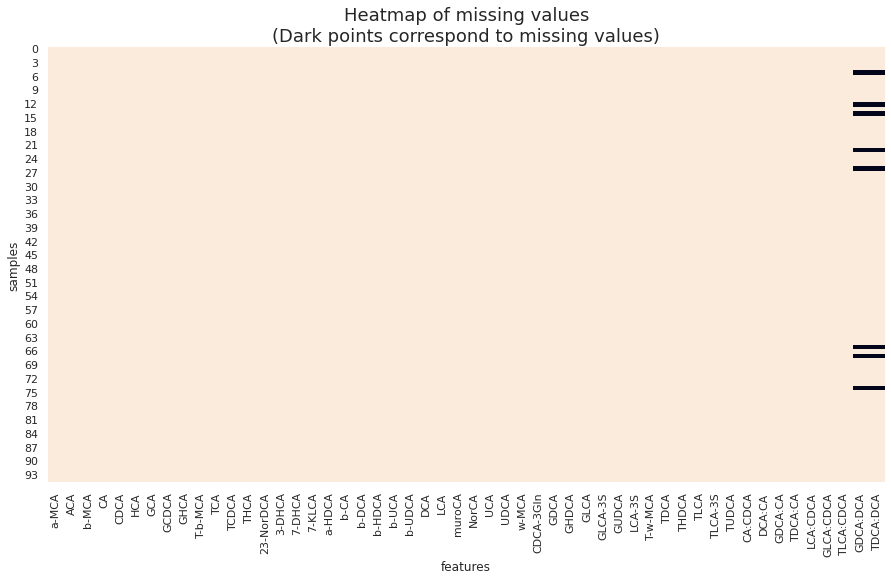

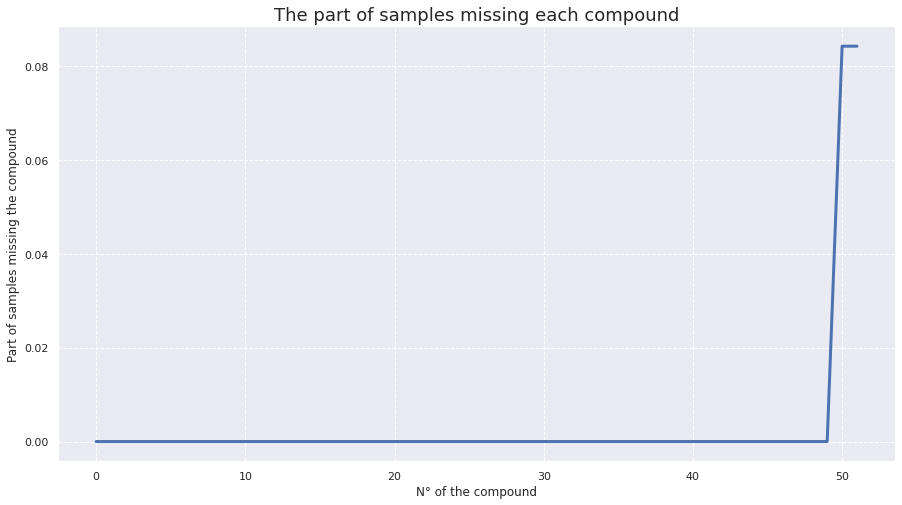



######################################################################################################################################################


In [17]:
plot_infos_missing_values(X)

### The function <code>plot_infos_missing_values</code> was developed to spot values equal to <code>NaN</code> by default. Here there are NaNs but missing values can also be in another form (0, 1, a specific string e.g. *'Unknown'* or *'NA'*, ...). We can pass argument <code>na_values</code> to specify the type of missing values in the peak table.

######################################################################################################################################################
Considering 0 as missing values :
- Total number of missing values : 418
- Percent of missing values : 8.46%



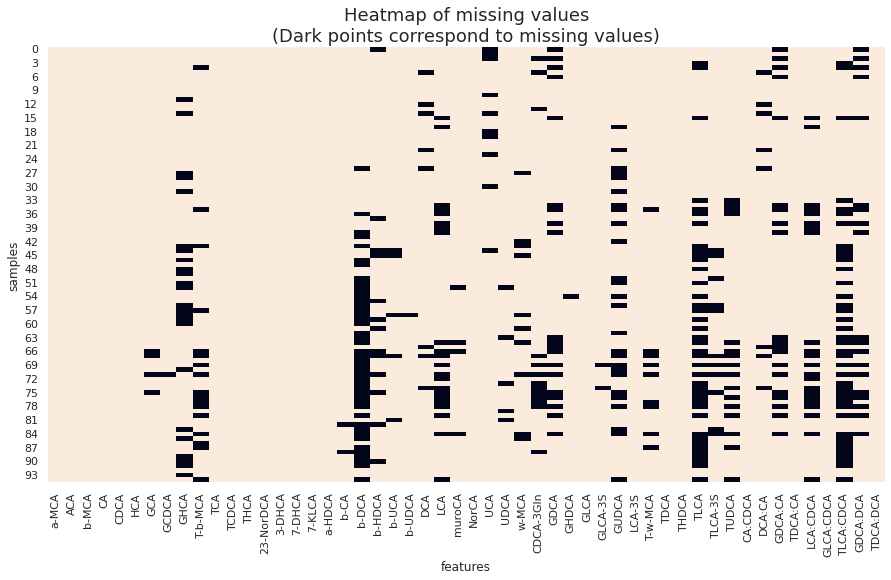

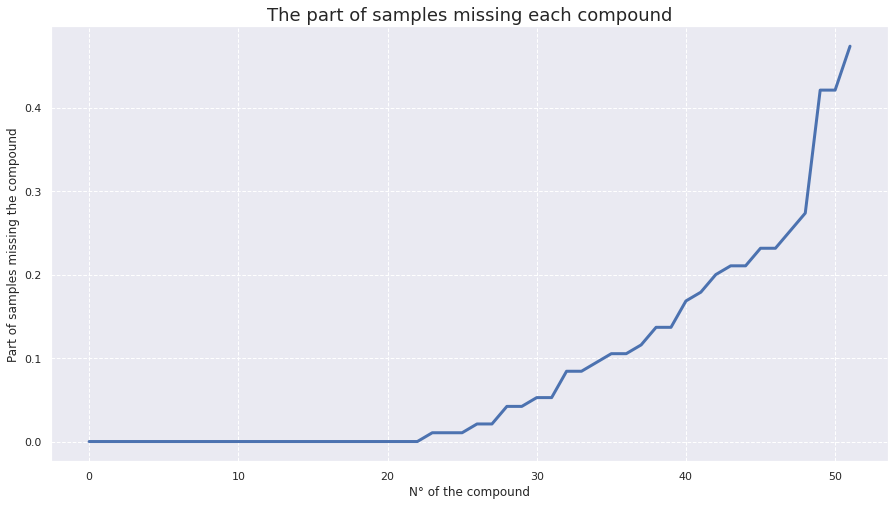



######################################################################################################################################################


In [18]:
plot_infos_missing_values(X, na_values=0)

## c - Correlation between features

######################################################################################################################################################


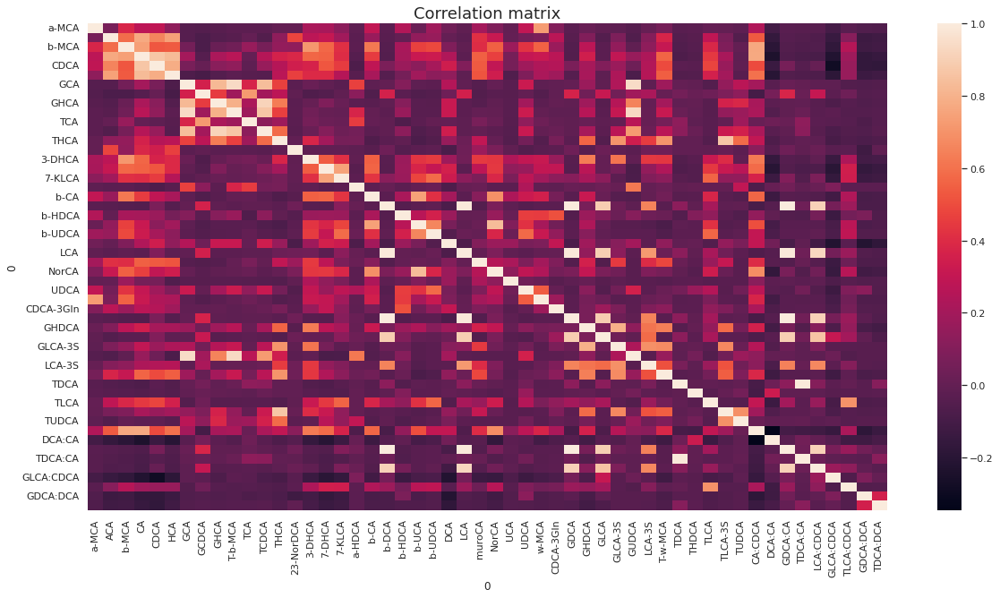

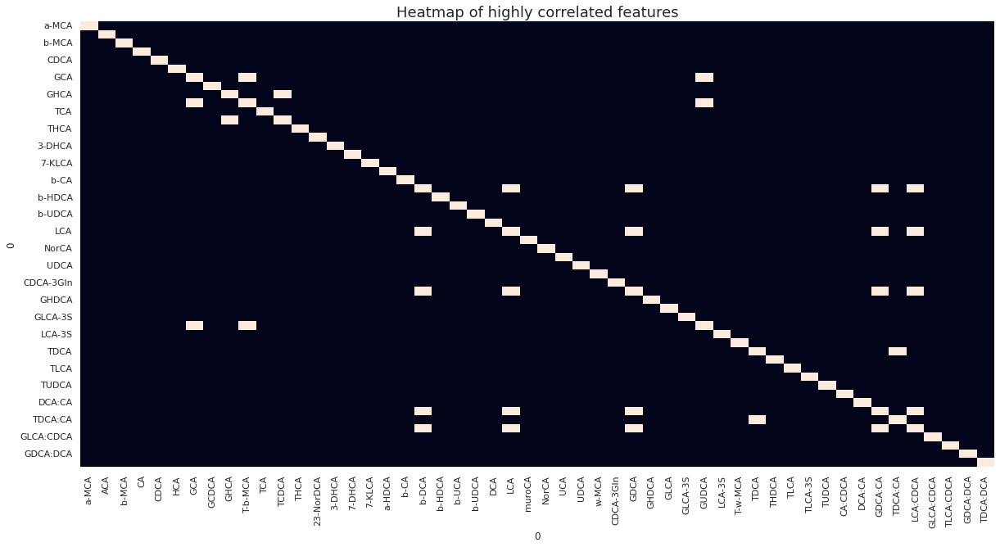



###################################################################################################################################################### 



In [19]:
plot_correlation_matrix(X, threshold=0.9)

## d - Remove strongly correlated features (to potentially avoid issues during further analysis)

In [20]:
X_remove_corr = remove_correlated_features(X)
X_remove_corr

Initial shape : (95, 52)
Final shape : (95, 48)

Time to compute : 00h00m00s

 ######################################################################################################################################################






,a-MCA,ACA,b-MCA,CA,CDCA,HCA,GCA,GCDCA,GHCA,T-b-MCA,...,TLCA,TLCA-3S,TUDCA,CA:CDCA,DCA:CA,LCA:CDCA,GLCA:CDCA,TLCA:CDCA,GDCA:DCA,TDCA:DCA
0,0.473369,28.321693,39.173192,1310.431746,121.319929,18.143915,50.288536,5.322751,0.395767,2.605996,...,0.002822,1.191534,83.363668,10.801455,0.127721,0.004605,0.000151,0.000023,0.000000,0.000358
1,59.614194,57.979355,26.272258,3348.520000,245.130323,59.877419,21.920000,1.776774,0.251613,3.547097,...,0.043871,0.754839,0.682581,13.660162,0.091134,0.000342,0.000153,0.000179,0.000161,0.000131
2,8.676522,6.440870,1.528696,404.870435,90.940000,10.999130,0.324348,0.436522,0.038261,0.025217,...,0.008696,0.109565,0.275652,4.452061,0.287106,0.026640,0.000115,0.000096,0.000000,0.000060
3,2.984348,21.568696,8.652754,1341.371594,389.247536,10.369855,4.687536,1.503768,0.026667,0.197101,...,0.000000,0.660870,0.038261,3.446063,0.000717,0.000298,0.000057,0.000000,0.020507,0.037394
4,15.832258,4.008065,7.782258,319.579032,35.891935,15.341129,0.439516,0.312097,0.033065,0.000000,...,0.000000,0.067742,0.038710,8.903923,0.135763,0.042579,0.000157,0.000000,0.000000,0.000204
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90,0.473387,0.542742,0.025806,15.682258,12.360484,0.403226,0.004839,0.050806,0.000000,0.071774,...,0.000000,0.437903,0.014516,1.268741,0.853492,0.026032,0.001892,0.000000,0.002591,0.001326
91,0.118072,0.756627,0.044177,96.975904,54.880321,1.232932,0.011245,0.008835,0.000000,0.053815,...,0.000000,0.436145,0.002410,1.767043,0.632956,0.001742,0.000424,0.000000,0.000445,0.000275
92,3.066013,0.422876,0.037255,46.444444,62.852941,0.421569,0.888889,3.512418,0.015033,0.124837,...,0.002614,0.365359,0.043791,0.738938,1.546032,0.001549,0.000218,0.000042,0.000255,0.000191
93,5.370060,0.877844,1.588024,293.049102,129.834731,2.943713,0.566467,0.950898,0.000000,0.250299,...,0.017964,1.779641,5.582036,2.257093,0.511173,0.001568,0.000175,0.000138,0.000184,0.026822


In [21]:
peakTable_remove_corr = pd.concat([metadata, X_remove_corr], axis=1)
peakTable_remove_corr

,sample,BAs,a-MCA,ACA,b-MCA,CA,CDCA,HCA,GCA,GCDCA,...,TLCA,TLCA-3S,TUDCA,CA:CDCA,DCA:CA,LCA:CDCA,GLCA:CDCA,TLCA:CDCA,GDCA:DCA,TDCA:DCA
0,HCL-11,HC,0.473369,28.321693,39.173192,1310.431746,121.319929,18.143915,50.288536,5.322751,...,0.002822,1.191534,83.363668,10.801455,0.127721,0.004605,0.000151,0.000023,0.000000,0.000358
1,HCL-9,HC,59.614194,57.979355,26.272258,3348.520000,245.130323,59.877419,21.920000,1.776774,...,0.043871,0.754839,0.682581,13.660162,0.091134,0.000342,0.000153,0.000179,0.000161,0.000131
2,HCL-10,HC,8.676522,6.440870,1.528696,404.870435,90.940000,10.999130,0.324348,0.436522,...,0.008696,0.109565,0.275652,4.452061,0.287106,0.026640,0.000115,0.000096,0.000000,0.000060
3,HCL-1,HC,2.984348,21.568696,8.652754,1341.371594,389.247536,10.369855,4.687536,1.503768,...,0.000000,0.660870,0.038261,3.446063,0.000717,0.000298,0.000057,0.000000,0.020507,0.037394
4,HCL-12,HC,15.832258,4.008065,7.782258,319.579032,35.891935,15.341129,0.439516,0.312097,...,0.000000,0.067742,0.038710,8.903923,0.135763,0.042579,0.000157,0.000000,0.000000,0.000204
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90,CH-88,CJ,0.473387,0.542742,0.025806,15.682258,12.360484,0.403226,0.004839,0.050806,...,0.000000,0.437903,0.014516,1.268741,0.853492,0.026032,0.001892,0.000000,0.002591,0.001326
91,CH-92,CJ,0.118072,0.756627,0.044177,96.975904,54.880321,1.232932,0.011245,0.008835,...,0.000000,0.436145,0.002410,1.767043,0.632956,0.001742,0.000424,0.000000,0.000445,0.000275
92,CH-89,CJ,3.066013,0.422876,0.037255,46.444444,62.852941,0.421569,0.888889,3.512418,...,0.002614,0.365359,0.043791,0.738938,1.546032,0.001549,0.000218,0.000042,0.000255,0.000191
93,CH-95-1,CJ,5.370060,0.877844,1.588024,293.049102,129.834731,2.943713,0.566467,0.950898,...,0.017964,1.779641,5.582036,2.257093,0.511173,0.001568,0.000175,0.000138,0.000184,0.026822


## e - PCA

In [23]:
if plot_infos_missing_values(X, plot=False) == 0:
    cb.plot.pca(X, pcx=1, pcy=2, group_label=target)
else:
    print('NaNs in peak table, please impute before using PCA')

NaNs in peak table, please impute before using PCA


In [24]:
if plot_infos_missing_values(X, plot=False) == 0:
    PCA_3D(X, peakTable, 'Disease')
else:
    print('NaNs in peak table, please impute before using PCA')

NaNs in peak table, please impute before using PCA


### We will plot PCA after missing value imputation

## f - Target visualisation

In [25]:
#target = 

######################################################################################################################################################
Target values : 
CJ     54
HFI    25
HC     16
Name: BAs, dtype: int64



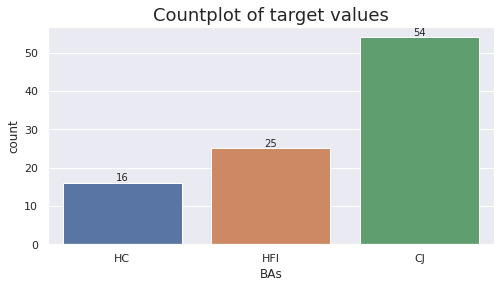

###################################################################################################################################################### 



In [26]:
plot_target(target)

## g - Feature visualisation

The following visualisations show the distributions of the chosen features of the peak table.

### We can set the number of features with <code>nb_features</code> parameter, which will plot the first N features of the peak table.

######################################################################################################################################################



<Figure size 720x720 with 0 Axes>

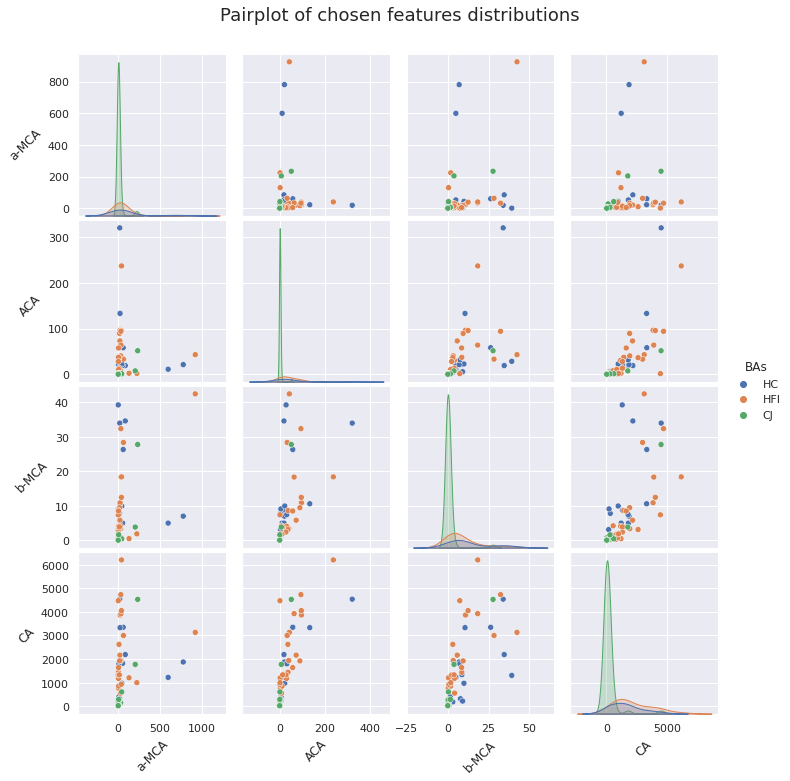

###################################################################################################################################################### 



In [27]:
plot_pairplot_distributions(X, target, nb_features=4)

### We can also set the list of features we want to plot with <code>list_features</code> parameter.

In [28]:
n_features = 3

list_features = random.sample(X.columns.tolist(), n_features)
list_features

['GHCA', 'b-HDCA', 'TUDCA']

######################################################################################################################################################



<Figure size 720x720 with 0 Axes>

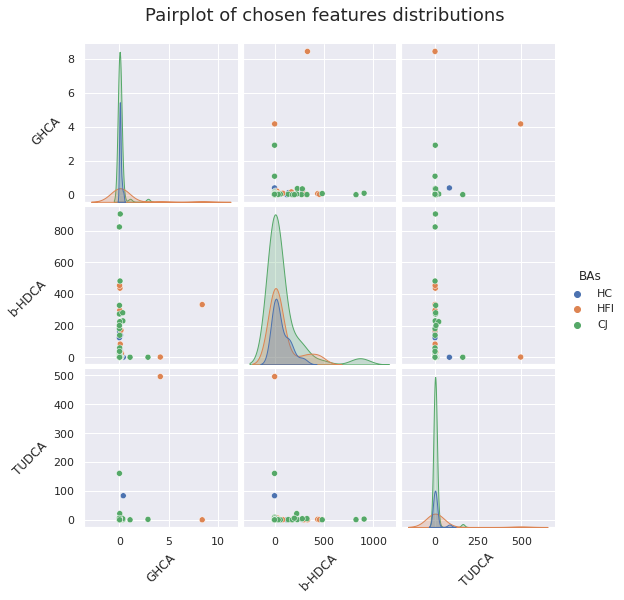

###################################################################################################################################################### 



In [29]:
plot_pairplot_distributions(X, target, list_features=list_features)

### Here we can observe histogram and boxplot for each chosen feature

######################################################################################################################################################

------------------------------------------------------------------------------------------------------------------------


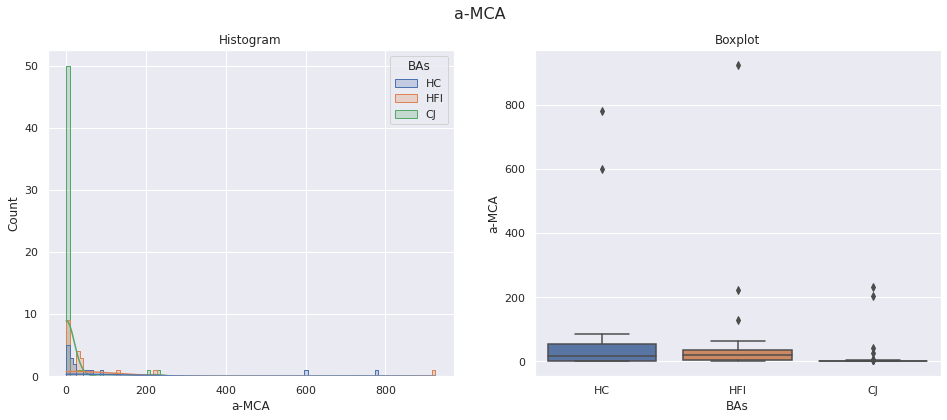

------------------------------------------------------------------------------------------------------------------------


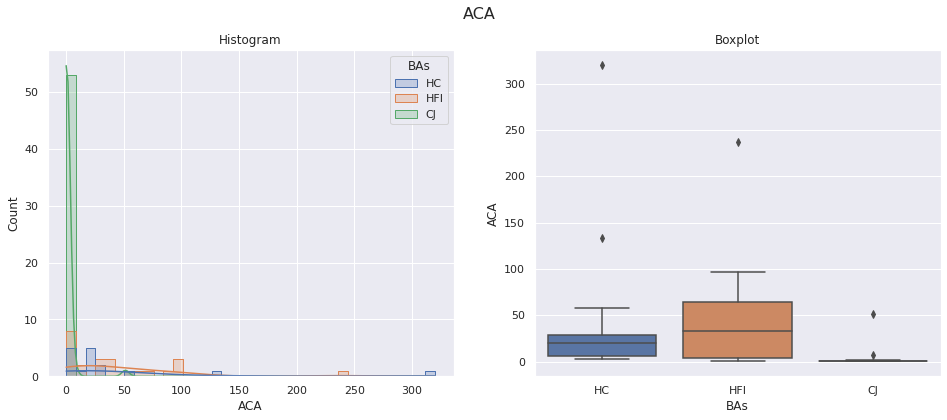

------------------------------------------------------------------------------------------------------------------------


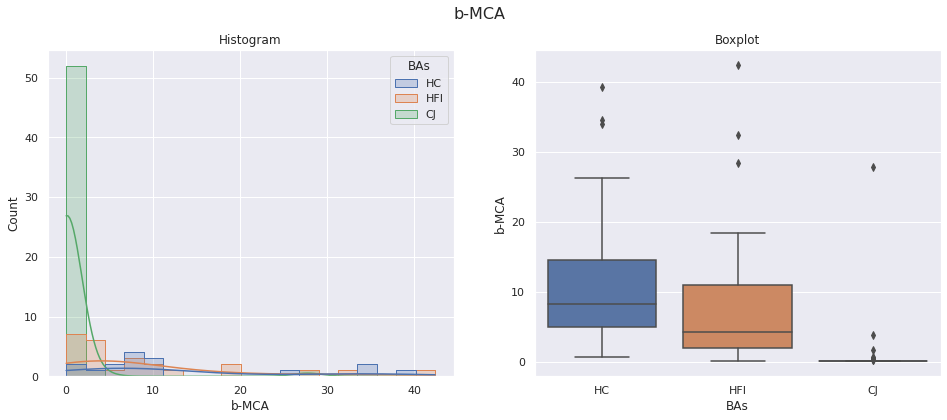

------------------------------------------------------------------------------------------------------------------------


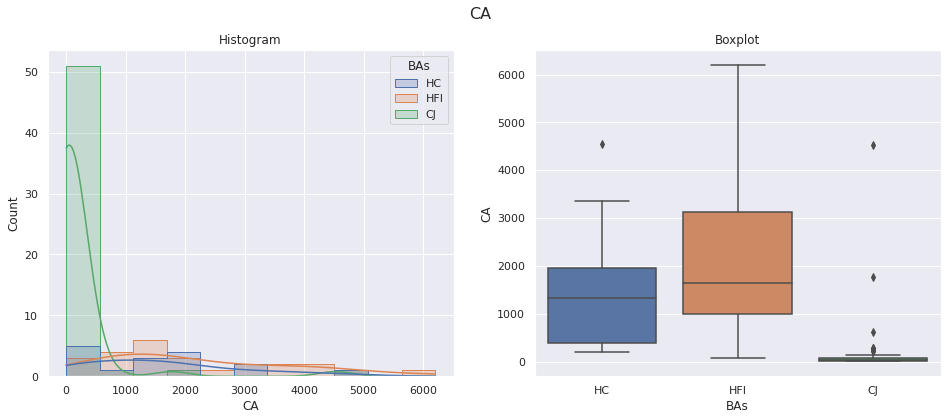

------------------------------------------------------------------------------------------------------------------------ 

######################################################################################################################################################


In [30]:
plot_hist_boxplot_distributions(X, target, nb_features=4)

######################################################################################################################################################

------------------------------------------------------------------------------------------------------------------------


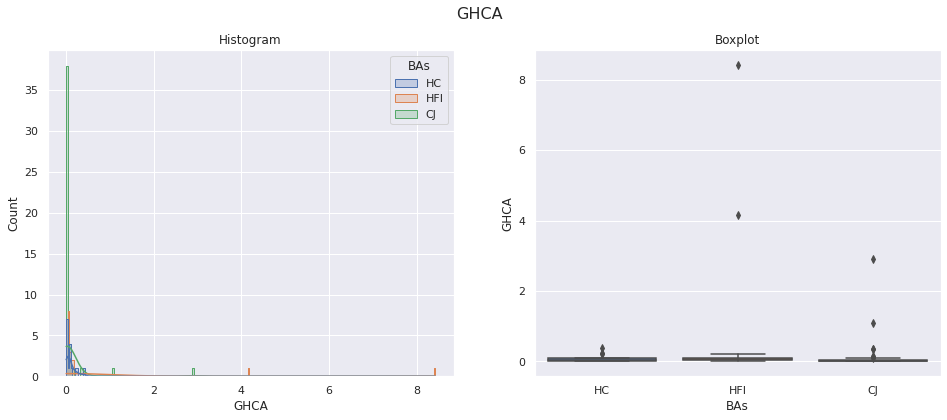

------------------------------------------------------------------------------------------------------------------------


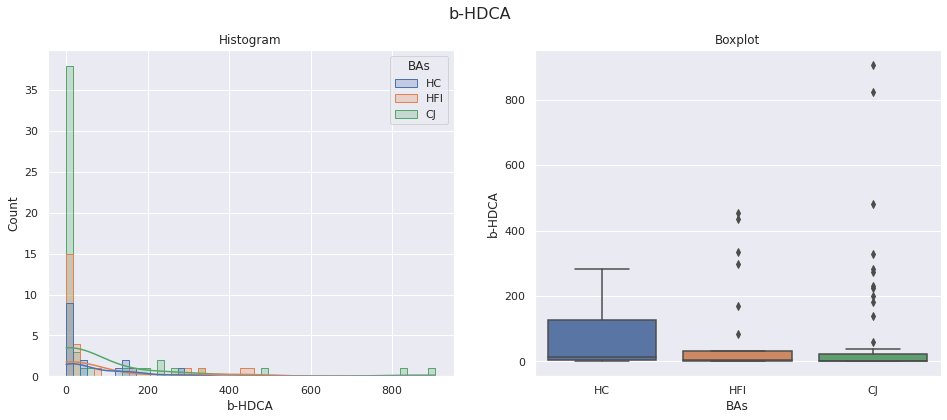

------------------------------------------------------------------------------------------------------------------------


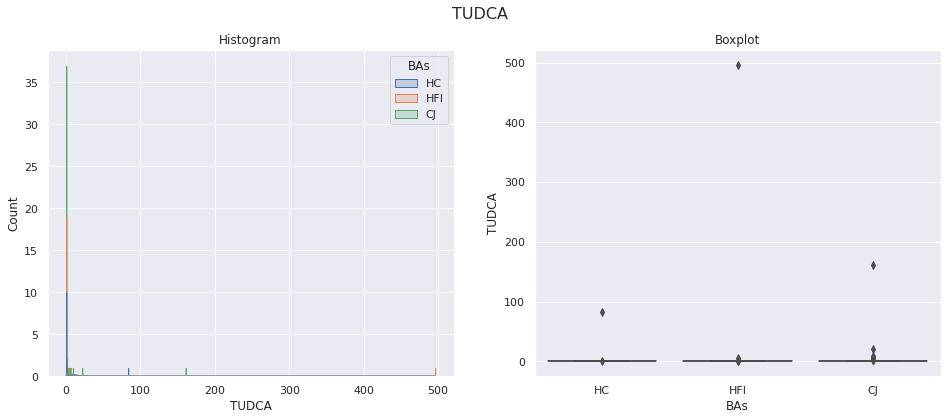

------------------------------------------------------------------------------------------------------------------------ 

######################################################################################################################################################


In [31]:
plot_hist_boxplot_distributions(X, target, list_features=list_features)

# 3 - Impute missing values

In [32]:
from missing_value_imputation_functions import *

### We observed before that missing values are here NaNs but there are also 0's. For further analysis, we prefer to avoid having 0's for mathematical purposes, we can replace these zeros by other values

######################################################################################################################################################
Considering None as missing values :
- Total number of missing values : 16
- Percent of missing values : 0.32%



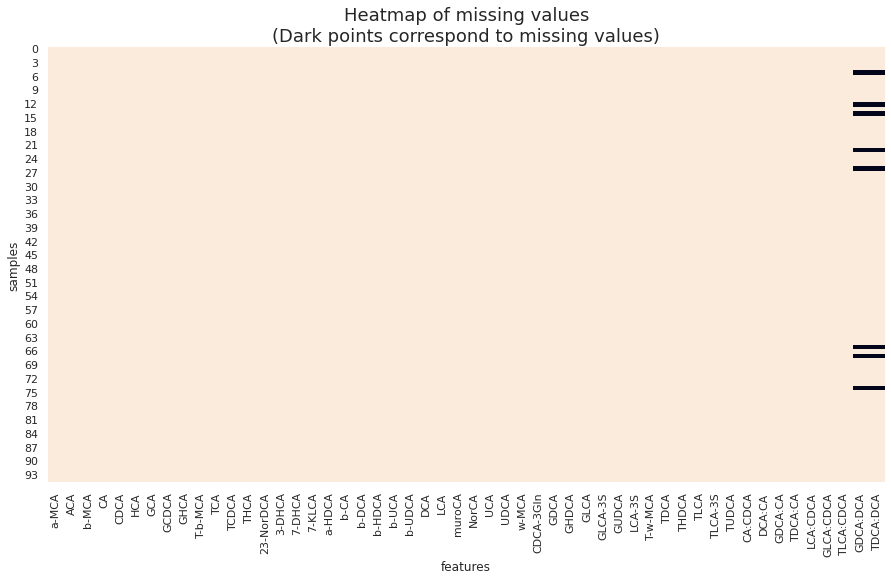

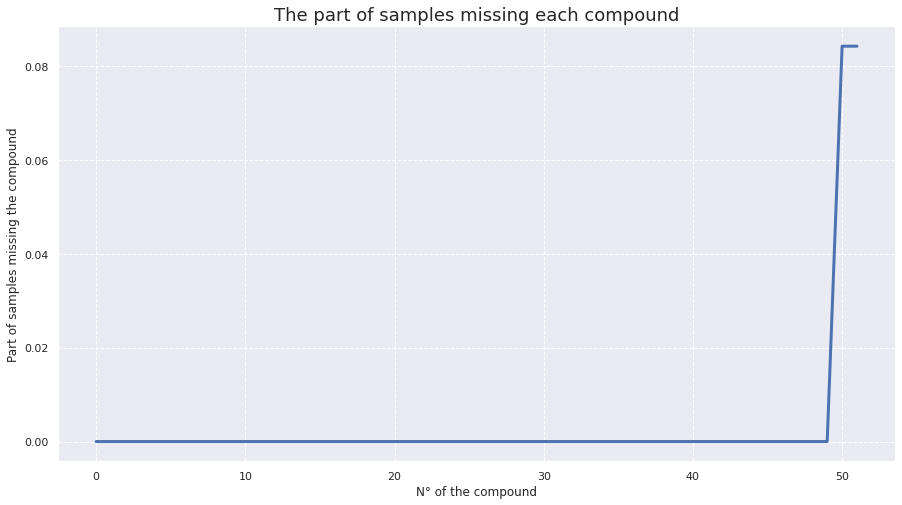



######################################################################################################################################################


In [33]:
plot_infos_missing_values(X, na_values=None) # same as simply plot_infos_missing_values(X)

######################################################################################################################################################
Considering 0 as missing values :
- Total number of missing values : 418
- Percent of missing values : 8.46%



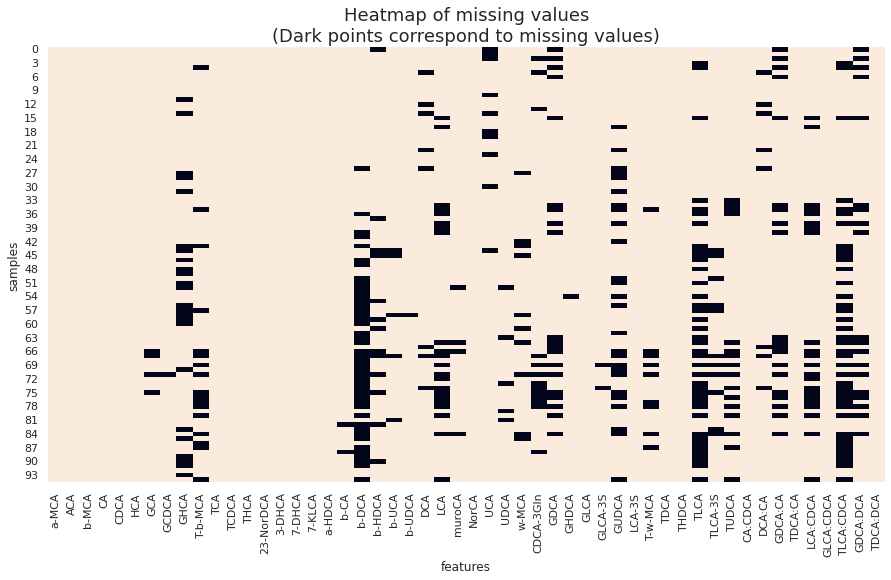

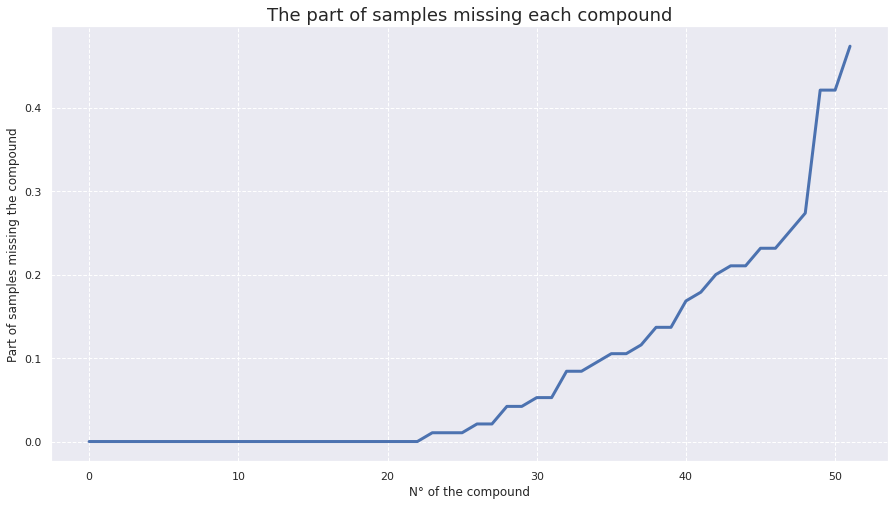



######################################################################################################################################################


In [34]:
plot_infos_missing_values(X, na_values=0)

### Set 0 to NaN to then impute with chosen imputer

In [35]:
X_with_Nan = X.copy()
X_with_Nan[X_with_Nan == 0] = np.nan

### Here it's probably not the best idea to impute missing values with 1's, because some values in the peak table are inferior to 1

## a - Impute intensities with half minimum value in features

In [36]:
X_imp_halfmin = half_min_imputer(X_with_Nan)
X_imp_halfmin

,a-MCA,ACA,b-MCA,CA,CDCA,HCA,GCA,GCDCA,GHCA,T-b-MCA,...,TUDCA,CA:CDCA,DCA:CA,GDCA:CA,TDCA:CA,LCA:CDCA,GLCA:CDCA,TLCA:CDCA,GDCA:DCA,TDCA:DCA
0,0.473369,28.321693,39.173192,1310.431746,121.319929,18.143915,50.288536,5.322751,0.395767,2.605996,...,83.363668,10.801455,0.127721,0.000001,0.000046,0.004605,0.000151,0.000023,0.000008,0.000358
1,59.614194,57.979355,26.272258,3348.520000,245.130323,59.877419,21.920000,1.776774,0.251613,3.547097,...,0.682581,13.660162,0.091134,0.000015,0.000012,0.000342,0.000153,0.000179,0.000161,0.000131
2,8.676522,6.440870,1.528696,404.870435,90.940000,10.999130,0.324348,0.436522,0.038261,0.025217,...,0.275652,4.452061,0.287106,0.000001,0.000017,0.026640,0.000115,0.000096,0.000008,0.000060
3,2.984348,21.568696,8.652754,1341.371594,389.247536,10.369855,4.687536,1.503768,0.026667,0.197101,...,0.038261,3.446063,0.000717,0.000015,0.000027,0.000298,0.000057,0.000002,0.020507,0.037394
4,15.832258,4.008065,7.782258,319.579032,35.891935,15.341129,0.439516,0.312097,0.033065,0.003030,...,0.038710,8.903923,0.135763,0.000001,0.000028,0.042579,0.000157,0.000002,0.000008,0.000204
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90,0.473387,0.542742,0.025806,15.682258,12.360484,0.403226,0.004839,0.050806,0.000508,0.071774,...,0.014516,1.268741,0.853492,0.002211,0.001131,0.026032,0.001892,0.000002,0.002591,0.001326
91,0.118072,0.756627,0.044177,96.975904,54.880321,1.232932,0.011245,0.008835,0.000508,0.053815,...,0.002410,1.767043,0.632956,0.000282,0.000174,0.001742,0.000424,0.000002,0.000445,0.000275
92,3.066013,0.422876,0.037255,46.444444,62.852941,0.421569,0.888889,3.512418,0.015033,0.124837,...,0.043791,0.738938,1.546032,0.000394,0.000296,0.001549,0.000218,0.000042,0.000255,0.000191
93,5.370060,0.877844,1.588024,293.049102,129.834731,2.943713,0.566467,0.950898,0.000508,0.250299,...,5.582036,2.257093,0.511173,0.000094,0.013711,0.001568,0.000175,0.000138,0.000184,0.026822


### We can check that there is no more missing values in the imputed peak tables

In [37]:
plot_infos_missing_values(X_imp_halfmin)

######################################################################################################################################################
Considering None as missing values :
- Total number of missing values : 0
- Percent of missing values : 0.00%



0

In [38]:
plot_infos_missing_values(X_imp_halfmin, na_values=0)

######################################################################################################################################################
Considering 0 as missing values :
- Total number of missing values : 0
- Percent of missing values : 0.00%



0

## b - PCA

In [39]:
if plot_infos_missing_values(X_imp_halfmin, plot=False) == 0:
    cb.plot.pca(X_imp_halfmin, pcx=1, pcy=2, group_label=target)
else:
    print('NaNs in peak table, please impute before using PCA')

Loading BokehJS ...

In [40]:
if plot_infos_missing_values(X_imp_halfmin, plot=False) == 0:
    PCA_3D(X_imp_halfmin, peakTable, target.name)
else:
    print('NaNs in peak table, please impute before using PCA')

# 4 - Transformations (here we will not transform dataset)

In [41]:
from normalisation_scaling_functions import *

## a - log transformation

In [42]:
#X_imp_halfmin_log = normPeakTable(X_imp_halfmin, 'log10', based='metabolite')
#X_imp_halfmin_log

## b - Standard scale intensities

In [43]:
#X_imp_halfmin_log_std = normPeakTable(X_imp_log_halfmin, 'autoscaling', based='metabolites')
#X_imp_halfmin_log_std

# 5 - Dimensionality reduction

In [44]:
from dimensionality_reduction_functions import *

## a - PCA then t-SNE

### The point of this step is to reduce dimensionality, argument <code>part_explained_variance</code> can be changed to set the part of initial explained variance we want to keep after reduction. We can also set the <code>n_components</code> argument to keep a specific number of PCA components.

In [45]:
# target = 

#################################################################################################### 



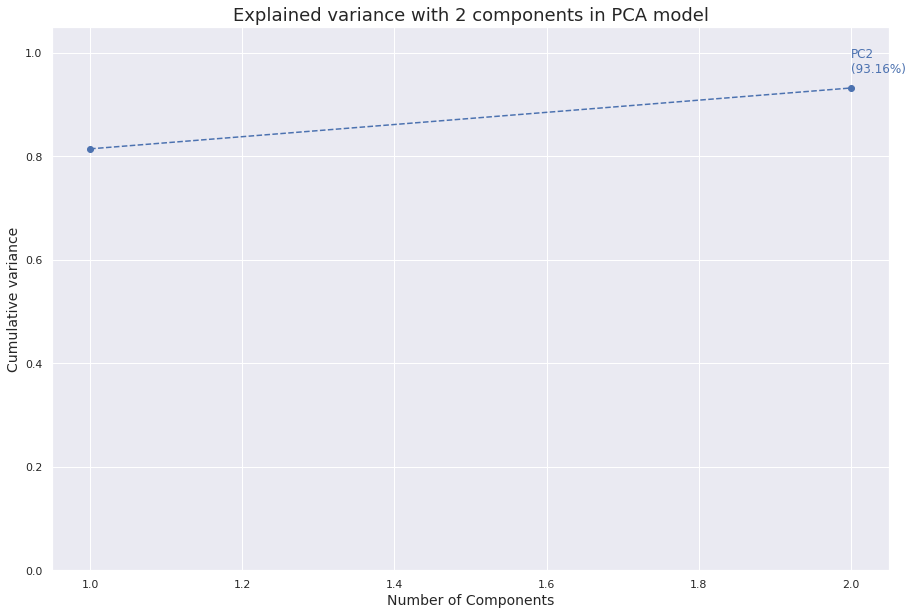

Initial number of dimension : 52
Final number of dimension : 2


,PC1,PC2
0,494.962603,268.970728
1,2769.547845,528.531362
2,-427.897846,414.673565
3,378.585376,-159.829969
4,-340.879329,981.567582
...,...,...
90,-1032.826830,-113.535117
91,-952.692398,-130.712963
92,-1001.132400,-124.232212
93,-748.123113,-189.577971



 #################################################################################################### 



In [46]:
print(100 * '#', '\n')

matrix = X_imp_halfmin.copy()

X_imp_halfmin_PCA, explained_variance = perform_PCA(matrix, n_components=2)
print(f'Initial number of dimension : {matrix.shape[1]}')
print(f'Final number of dimension : {explained_variance.shape[0]}')
display(X_imp_halfmin_PCA)

print('\n', 100 * '#', '\n')

#n_components = 2
#X_imp_halfmin_PCA_tSNE = perform_tSNE(X_imp_halfmin_PCA, metadata=metadata, n_components=n_components, targets_plot=[target.name])
#display(X_imp_halfmin_PCA_tSNE)

## b - Feature selection keeping all features with ANOVA pvalue $\lt \alpha \hspace{0.39cm}$

In [47]:
#target = peakTable['Disease']
matrix = X_imp_halfmin.copy()

X_imp_halfmin_fs_anova, feature_scores = select_best_features(matrix, target, alpha=0.01)
print(f'Initial number of dimension : {matrix.shape[1]}')
print(f'Final number of dimension : {feature_scores.shape[0]}')
display(feature_scores)
display(X_imp_halfmin_fs_anova)

Initial number of dimension : 52
Final number of dimension : 19


,features,f_scores,p_values
43,CA:CDCA,42.531,0.0000
4,CDCA,34.487,0.0000
3,CA,32.421,0.0000
5,HCA,31.380,0.0000
15,7-DHCA,21.860,0.0000
26,NorCA,20.381,0.0000
2,b-MCA,18.830,0.0000
16,7-KLCA,17.928,0.0000
23,DCA,12.922,0.0000
1,ACA,11.766,0.0000


,CA:CDCA,CDCA,CA,HCA,7-DHCA,NorCA,b-MCA,7-KLCA,DCA,ACA,3-DHCA,UCA,b-CA,TLCA,b-UCA,THCA,muroCA,T-w-MCA,TLCA:CDCA
0,10.801455,121.319929,1310.431746,18.143915,805.506173,5.439153,39.173192,101.603831,167.370018,28.321693,489.161905,0.000310,31.725573,0.002822,32.606702,21.540741,0.185538,5.358025,0.000023
1,13.660162,245.130323,3348.520000,59.877419,1610.107097,25.641290,26.272258,133.160268,305.165161,57.979355,459.280000,0.000310,1266.674839,0.043871,462.423226,1.401290,0.100645,2.343226,0.000179
2,4.452061,90.940000,404.870435,10.999130,676.873043,4.212174,1.528696,92.825276,116.240870,6.440870,94.107826,0.000310,43.950435,0.008696,185.613913,0.060000,0.005217,0.014783,0.000096
3,3.446063,389.247536,1341.371594,10.369855,421.285797,4.696812,8.652754,13.026096,0.961159,21.568696,75.823768,9.740290,7.762319,0.000310,1.282319,0.217971,0.265507,2.388406,0.000002
4,8.903923,35.891935,319.579032,15.341129,1273.057258,0.757258,7.782258,39.661155,43.387097,4.008065,155.670161,13.371774,14.374194,0.000310,0.948387,0.020968,0.037097,0.045161,0.000002
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90,1.268741,12.360484,15.682258,0.403226,6.453226,0.037903,0.025806,0.338462,13.384677,0.542742,1.146774,0.069355,0.136290,0.000310,0.136290,0.050806,0.055645,0.129839,0.000002
91,1.767043,54.880321,96.975904,1.232932,11.450602,0.306827,0.044177,0.483713,61.381526,0.756627,11.487550,0.027309,0.093173,0.000310,0.008835,0.044177,0.105221,0.102008,0.000002
92,0.738938,62.852941,46.444444,0.421569,0.405229,0.054902,0.037255,0.206435,71.804575,0.422876,1.583660,0.021569,1.102614,0.002614,0.004575,0.158824,0.043137,0.226144,0.000042
93,2.257093,129.834731,293.049102,2.943713,3.786826,0.835928,1.588024,24.467886,149.798802,0.877844,14.113772,7.570060,19.435928,0.017964,0.663473,1.692216,0.077844,2.235928,0.000138


## c - Feature selection keeping a specific number of features

### Keeping 10 features

In [48]:
#target = peakTable['Disease']
matrix = X_imp_halfmin.copy()

X_imp_halfmin_fs_nb_10, feature_scores = select_best_features(matrix, target, k=10)
print(f'Initial number of dimension : {matrix.shape[1]}')
print(f'Final number of dimension : {feature_scores.shape[0]}')
display(feature_scores)
display(X_imp_halfmin_fs_nb_10)

Initial number of dimension : 52
Final number of dimension : 10


,features,f_scores,p_values
43,CA:CDCA,42.531,0.0
4,CDCA,34.487,0.0
3,CA,32.421,0.0
5,HCA,31.380,0.0
15,7-DHCA,21.860,0.0
26,NorCA,20.381,0.0
2,b-MCA,18.830,0.0
16,7-KLCA,17.928,0.0
23,DCA,12.922,0.0
1,ACA,11.766,0.0


,CA:CDCA,CDCA,CA,HCA,7-DHCA,NorCA,b-MCA,7-KLCA,DCA,ACA
0,10.801455,121.319929,1310.431746,18.143915,805.506173,5.439153,39.173192,101.603831,167.370018,28.321693
1,13.660162,245.130323,3348.520000,59.877419,1610.107097,25.641290,26.272258,133.160268,305.165161,57.979355
2,4.452061,90.940000,404.870435,10.999130,676.873043,4.212174,1.528696,92.825276,116.240870,6.440870
3,3.446063,389.247536,1341.371594,10.369855,421.285797,4.696812,8.652754,13.026096,0.961159,21.568696
4,8.903923,35.891935,319.579032,15.341129,1273.057258,0.757258,7.782258,39.661155,43.387097,4.008065
...,...,...,...,...,...,...,...,...,...,...
90,1.268741,12.360484,15.682258,0.403226,6.453226,0.037903,0.025806,0.338462,13.384677,0.542742
91,1.767043,54.880321,96.975904,1.232932,11.450602,0.306827,0.044177,0.483713,61.381526,0.756627
92,0.738938,62.852941,46.444444,0.421569,0.405229,0.054902,0.037255,0.206435,71.804575,0.422876
93,2.257093,129.834731,293.049102,2.943713,3.786826,0.835928,1.588024,24.467886,149.798802,0.877844


######################################################################################################################################################


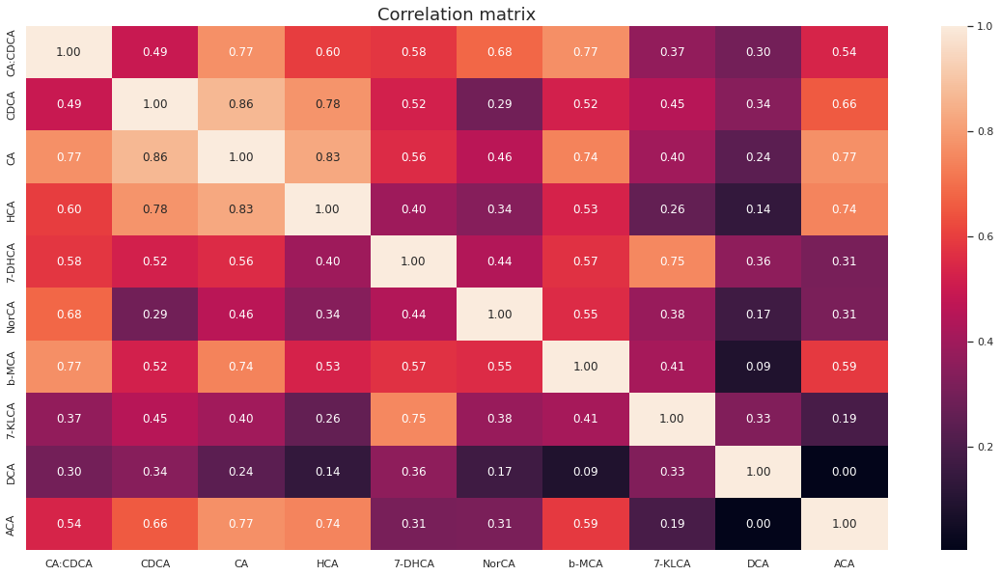

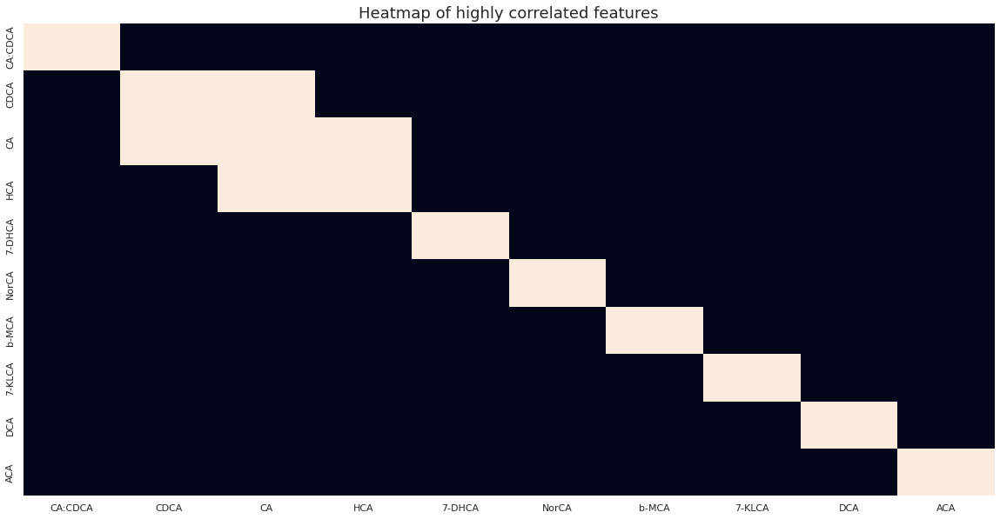



###################################################################################################################################################### 



In [49]:
matrix = pd.concat([target, X_imp_halfmin_fs_nb_10], axis=1)
plot_correlation_matrix(matrix, threshold=0.8, annot=True, fmt='.2f')

### Keeping 5 features

In [50]:
#target = peakTable['Disease']
matrix = X_imp_halfmin.copy()

X_imp_halfmin_fs_nb_5, feature_scores = select_best_features(matrix, target, k=5)
print(f'Initial number of dimension : {matrix.shape[1]}')
print(f'Final number of dimension : {feature_scores.shape[0]}')
display(feature_scores)
display(X_imp_halfmin_fs_nb_5)

Initial number of dimension : 52
Final number of dimension : 5


,features,f_scores,p_values
43,CA:CDCA,42.531,0.0
4,CDCA,34.487,0.0
3,CA,32.421,0.0
5,HCA,31.380,0.0
15,7-DHCA,21.860,0.0


,CA:CDCA,CDCA,CA,HCA,7-DHCA
0,10.801455,121.319929,1310.431746,18.143915,805.506173
1,13.660162,245.130323,3348.520000,59.877419,1610.107097
2,4.452061,90.940000,404.870435,10.999130,676.873043
3,3.446063,389.247536,1341.371594,10.369855,421.285797
4,8.903923,35.891935,319.579032,15.341129,1273.057258
...,...,...,...,...,...
90,1.268741,12.360484,15.682258,0.403226,6.453226
91,1.767043,54.880321,96.975904,1.232932,11.450602
92,0.738938,62.852941,46.444444,0.421569,0.405229
93,2.257093,129.834731,293.049102,2.943713,3.786826


######################################################################################################################################################


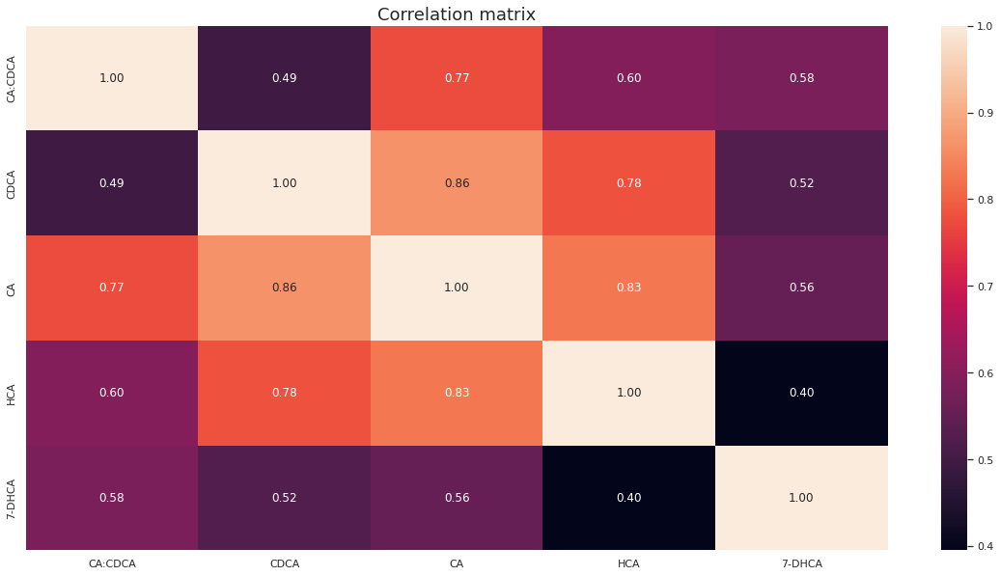

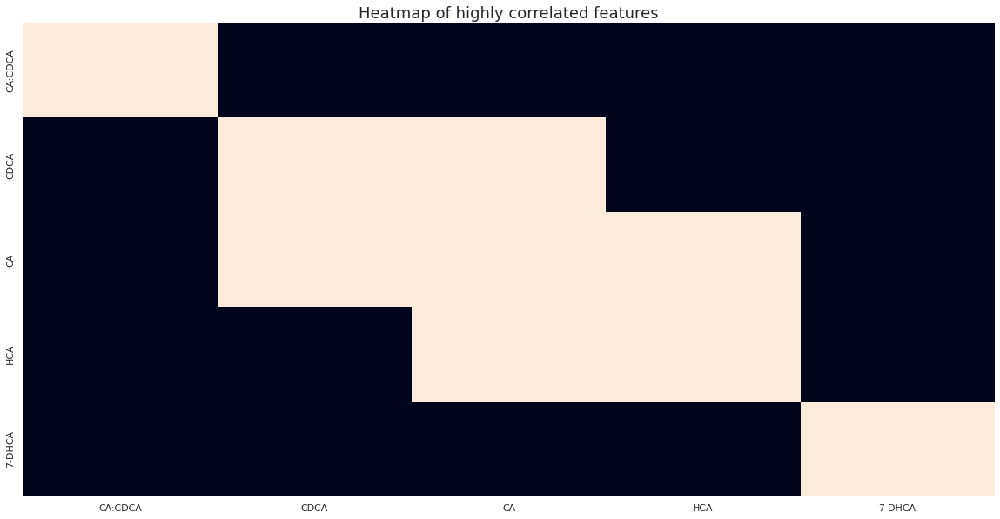



###################################################################################################################################################### 



In [51]:
matrix = pd.concat([target, X_imp_halfmin_fs_nb_5], axis=1)
plot_correlation_matrix(matrix, threshold=0.8, annot=True, fmt='.2f')

### Keeping 1 feature

In [52]:
#target = peakTable['Disease']
matrix = X_imp_halfmin.copy()

X_imp_halfmin_fs_nb_1, feature_scores = select_best_features(matrix, target, k=1)
print(f'Initial number of dimension : {matrix.shape[1]}')
print(f'Final number of dimension : {feature_scores.shape[0]}')
display(feature_scores)
display(X_imp_halfmin_fs_nb_1)

Initial number of dimension : 52
Final number of dimension : 1


,features,f_scores,p_values
43,CA:CDCA,42.531,0.0


,CA:CDCA
0,10.801455
1,13.660162
2,4.452061
3,3.446063
4,8.903923
...,...
90,1.268741
91,1.767043
92,0.738938
93,2.257093


#### For further analysis, we have the following reduced dataframes :
- <code>X_imp_halfmin_PCA</code> : reduced peak table with PCA keeping 95% of initial explained variance
- <code>X_imp_halfmin_fs_anova</code> : reduced peak table by keeping all features with ANOVA pvalue $\lt \alpha \hspace{0.39cm}$
- <code>X_imp_halfmin_fs_nb_N</code> : reduced peak table by keeping a specific number of features (with $N=\{1;5;10\}$ here)

# 6 - Classification

In [53]:
from classification_functions import *

In [54]:
from sklearn.linear_model import RidgeClassifier, LogisticRegression, SGDClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier, NearestCentroid
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, AdaBoostClassifier, GradientBoostingClassifier, HistGradientBoostingClassifier
from sklearn.neural_network import MLPClassifier

from sklearn.model_selection import LeaveOneOut

## a - Launch pipeline with differently preprocessed dataframes

In [55]:
# target =

### with <code>X_imp_halfmin_PCA</code>

#################################################################-----------------###################################################################
################################################################| RidgeClassifier |##################################################################
#################################################################-----------------###################################################################

Corresponding classes to labels : {'CJ': 0, 'HC': 1, 'HFI': 2}

Confusion matrix :


,CJ,HC,HFI
true/pred,,,
CJ,11,0,0
HC,2,0,1
HFI,1,1,3



Classification report :


,precision,recall,f1-score,support
CJ,0.79,1.00,0.88,11.00
HC,0.00,0.00,0.00,3.00
HFI,0.75,0.60,0.67,5.00
accuracy,0.74,0.74,0.74,0.74
macro avg,0.51,0.53,0.52,19.00
weighted avg,0.65,0.74,0.68,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 16 members, which is less than n_splits=20.



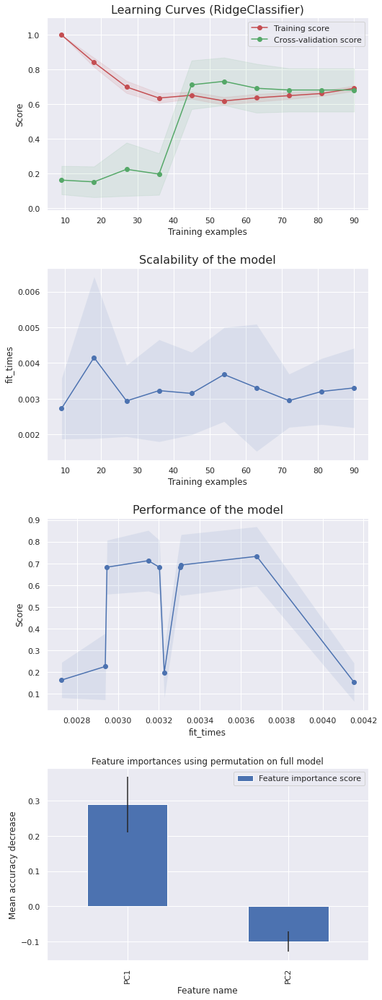




################################################################--------------------#################################################################
###############################################################| LogisticRegression |################################################################
################################################################--------------------#################################################################

Corresponding classes to labels : {'CJ': 0, 'HC': 1, 'HFI': 2}

Confusion matrix :


,CJ,HC,HFI
true/pred,,,
CJ,11,0,0
HC,2,0,1
HFI,0,1,4



Classification report :


,precision,recall,f1-score,support
CJ,0.85,1.00,0.92,11.00
HC,0.00,0.00,0.00,3.00
HFI,0.80,0.80,0.80,5.00
accuracy,0.79,0.79,0.79,0.79
macro avg,0.55,0.60,0.57,19.00
weighted avg,0.70,0.79,0.74,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 16 members, which is less than n_splits=20.

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preproces

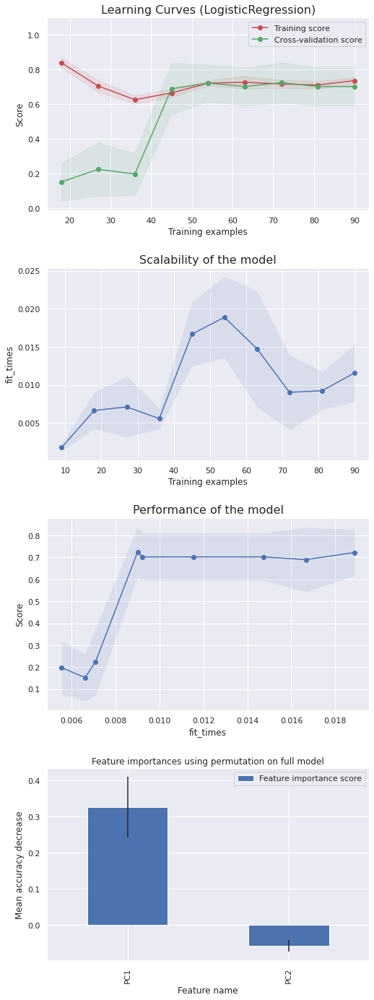




############################################################----------------------------#############################################################
###########################################################| LinearDiscriminantAnalysis |############################################################
############################################################----------------------------#############################################################

Corresponding classes to labels : {'CJ': 0, 'HC': 1, 'HFI': 2}

Confusion matrix :


,CJ,HC,HFI
true/pred,,,
CJ,11,0,0
HC,2,0,1
HFI,0,1,4



Classification report :


,precision,recall,f1-score,support
CJ,0.85,1.00,0.92,11.00
HC,0.00,0.00,0.00,3.00
HFI,0.80,0.80,0.80,5.00
accuracy,0.79,0.79,0.79,0.79
macro avg,0.55,0.60,0.57,19.00
weighted avg,0.70,0.79,0.74,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 16 members, which is less than n_splits=20.



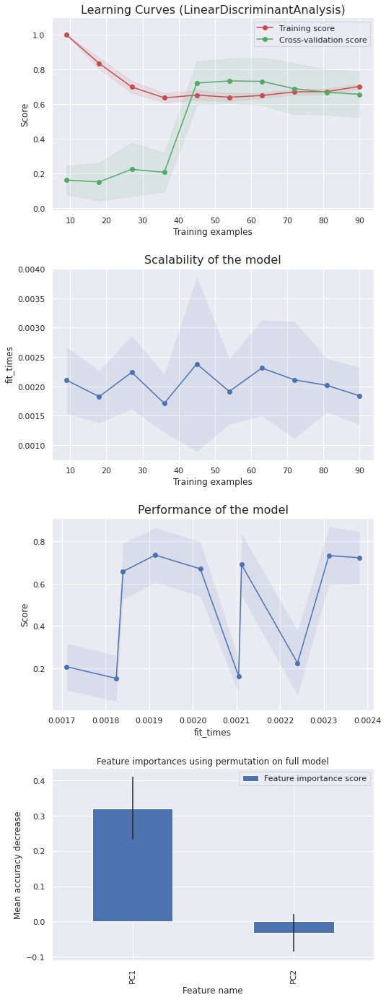




#######################################################################-----#########################################################################
######################################################################| SVC |########################################################################
#######################################################################-----#########################################################################

Corresponding classes to labels : {'CJ': 0, 'HC': 1, 'HFI': 2}

Confusion matrix :


,CJ,HC,HFI
true/pred,,,
CJ,11,0,0
HC,1,0,2
HFI,1,0,4



Classification report :


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



,precision,recall,f1-score,support
CJ,0.85,1.00,0.92,11.00
HC,0.00,0.00,0.00,3.00
HFI,0.67,0.80,0.73,5.00
accuracy,0.79,0.79,0.79,0.79
macro avg,0.50,0.60,0.55,19.00
weighted avg,0.67,0.79,0.72,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 16 members, which is less than n_splits=20.



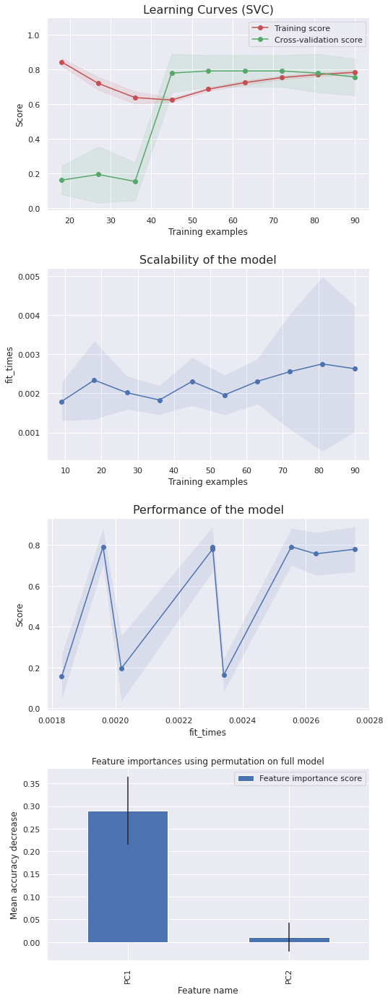




##################################################################---------------####################################################################
#################################################################| SGDClassifier |###################################################################
##################################################################---------------####################################################################

Corresponding classes to labels : {'CJ': 0, 'HC': 1, 'HFI': 2}

Confusion matrix :


,CJ,HC,HFI
true/pred,,,
CJ,0,11,0
HC,0,2,1
HFI,0,0,5



Classification report :


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



,precision,recall,f1-score,support
CJ,0.00,0.00,0.00,11.00
HC,0.15,0.67,0.25,3.00
HFI,0.83,1.00,0.91,5.00
accuracy,0.37,0.37,0.37,0.37
macro avg,0.33,0.56,0.39,19.00
weighted avg,0.24,0.37,0.28,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 16 members, which is less than n_splits=20.



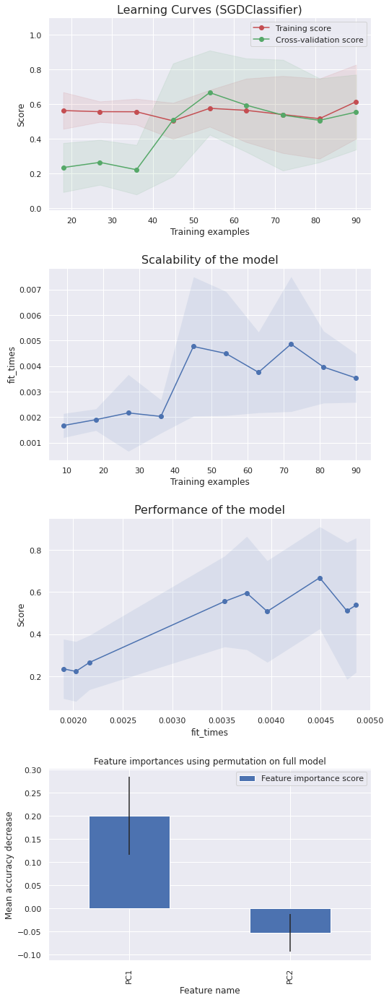




###############################################################----------------------################################################################
##############################################################| KNeighborsClassifier |###############################################################
###############################################################----------------------################################################################

Corresponding classes to labels : {'CJ': 0, 'HC': 1, 'HFI': 2}

Confusion matrix :


,CJ,HC,HFI
true/pred,,,
CJ,11,0,0
HC,1,1,1
HFI,0,3,2



Classification report :


,precision,recall,f1-score,support
CJ,0.92,1.00,0.96,11.00
HC,0.25,0.33,0.29,3.00
HFI,0.67,0.40,0.50,5.00
accuracy,0.74,0.74,0.74,0.74
macro avg,0.61,0.58,0.58,19.00
weighted avg,0.75,0.74,0.73,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 16 members, which is less than n_splits=20.



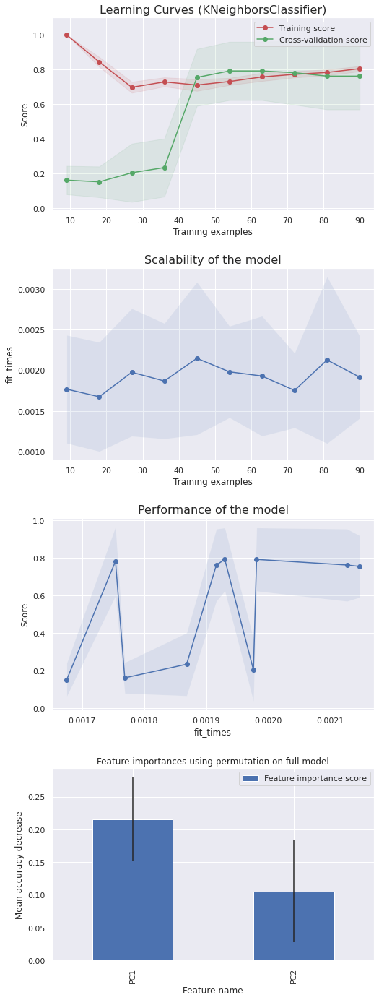




#################################################################-----------------###################################################################
################################################################| NearestCentroid |##################################################################
#################################################################-----------------###################################################################

Corresponding classes to labels : {'CJ': 0, 'HC': 1, 'HFI': 2}

Confusion matrix :


,CJ,HC,HFI
true/pred,,,
CJ,11,0,0
HC,2,0,1
HFI,0,1,4



Classification report :


,precision,recall,f1-score,support
CJ,0.85,1.00,0.92,11.00
HC,0.00,0.00,0.00,3.00
HFI,0.80,0.80,0.80,5.00
accuracy,0.79,0.79,0.79,0.79
macro avg,0.55,0.60,0.57,19.00
weighted avg,0.70,0.79,0.74,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 16 members, which is less than n_splits=20.



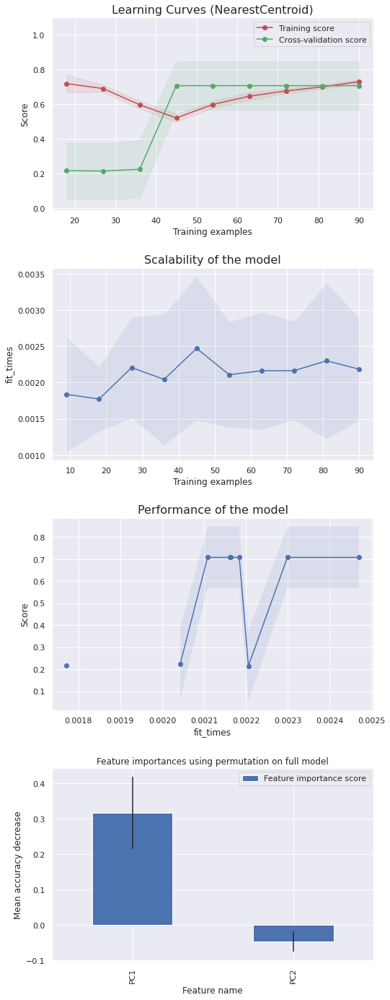




############################################################---------------------------##############################################################
###########################################################| GaussianProcessClassifier |#############################################################
############################################################---------------------------##############################################################

Corresponding classes to labels : {'CJ': 0, 'HC': 1, 'HFI': 2}

Confusion matrix :


,CJ,HC,HFI
true/pred,,,
CJ,11,0,0
HC,1,1,1
HFI,1,1,3



Classification report :


,precision,recall,f1-score,support
CJ,0.85,1.00,0.92,11.00
HC,0.50,0.33,0.40,3.00
HFI,0.75,0.60,0.67,5.00
accuracy,0.79,0.79,0.79,0.79
macro avg,0.70,0.64,0.66,19.00
weighted avg,0.77,0.79,0.77,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 16 members, which is less than n_splits=20.

/opt/conda/lib/python3.10/site-packages/sklearn/gaussian_process/_gpc.py:472: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/opt/conda/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_s

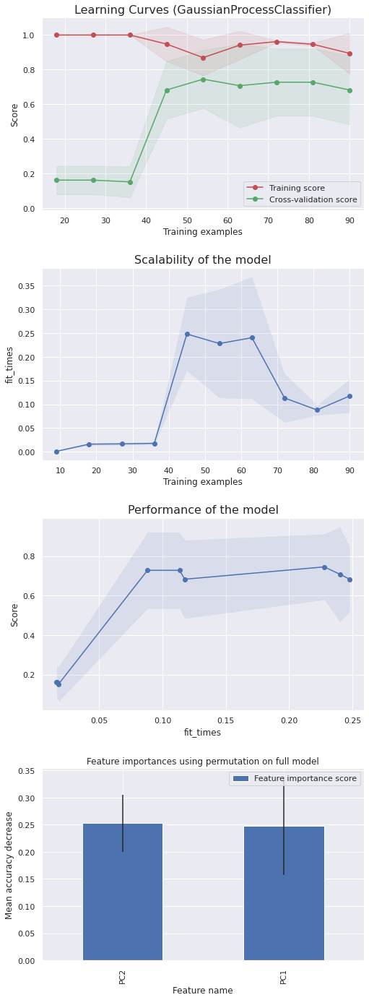




####################################################################------------#####################################################################
###################################################################| GaussianNB |####################################################################
####################################################################------------#####################################################################

Corresponding classes to labels : {'CJ': 0, 'HC': 1, 'HFI': 2}

Confusion matrix :


,CJ,HC,HFI
true/pred,,,
CJ,11,0,0
HC,1,1,1
HFI,0,0,5



Classification report :


,precision,recall,f1-score,support
CJ,0.92,1.00,0.96,11.00
HC,1.00,0.33,0.50,3.00
HFI,0.83,1.00,0.91,5.00
accuracy,0.89,0.89,0.89,0.89
macro avg,0.92,0.78,0.79,19.00
weighted avg,0.91,0.89,0.87,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 16 members, which is less than n_splits=20.



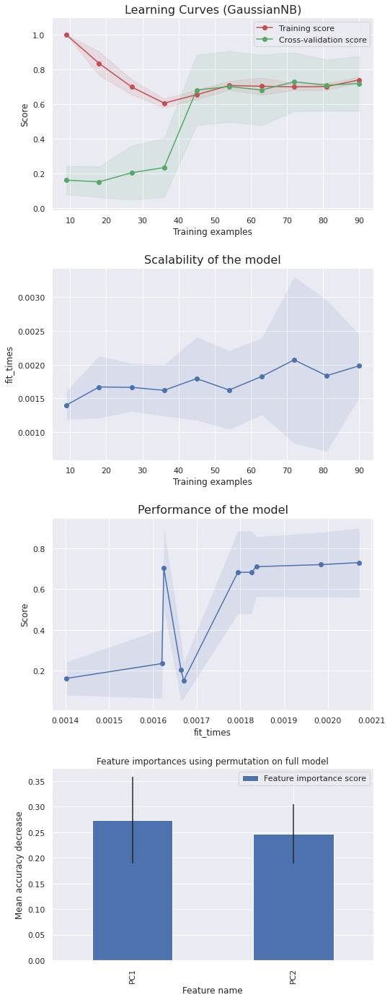




##############################################################------------------------###############################################################
#############################################################| DecisionTreeClassifier |##############################################################
##############################################################------------------------###############################################################

Corresponding classes to labels : {'CJ': 0, 'HC': 1, 'HFI': 2}

Confusion matrix :


,CJ,HC,HFI
true/pred,,,
CJ,11,0,0
HC,0,1,2
HFI,1,2,2



Classification report :


,precision,recall,f1-score,support
CJ,0.92,1.00,0.96,11.00
HC,0.33,0.33,0.33,3.00
HFI,0.50,0.40,0.44,5.00
accuracy,0.74,0.74,0.74,0.74
macro avg,0.58,0.58,0.58,19.00
weighted avg,0.71,0.74,0.72,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 16 members, which is less than n_splits=20.



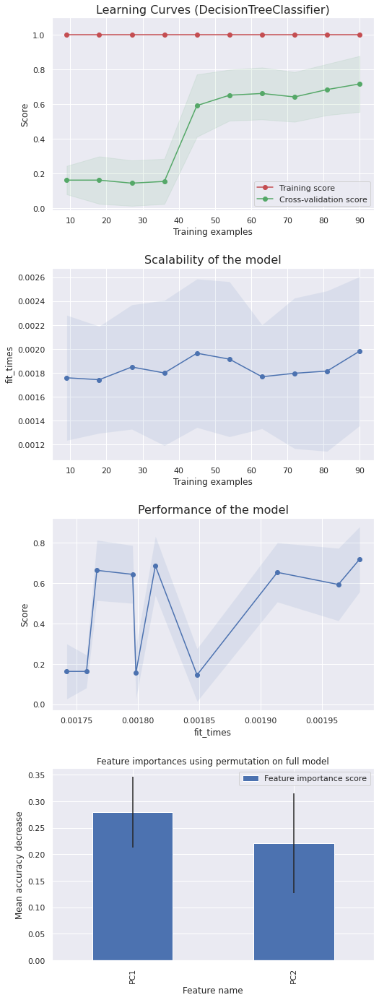




##############################################################------------------------###############################################################
#############################################################| RandomForestClassifier |##############################################################
##############################################################------------------------###############################################################

Corresponding classes to labels : {'CJ': 0, 'HC': 1, 'HFI': 2}

Confusion matrix :


,CJ,HC,HFI
true/pred,,,
CJ,11,0,0
HC,0,1,2
HFI,0,1,4



Classification report :


,precision,recall,f1-score,support
CJ,1.00,1.00,1.00,11.00
HC,0.50,0.33,0.40,3.00
HFI,0.67,0.80,0.73,5.00
accuracy,0.84,0.84,0.84,0.84
macro avg,0.72,0.71,0.71,19.00
weighted avg,0.83,0.84,0.83,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 16 members, which is less than n_splits=20.



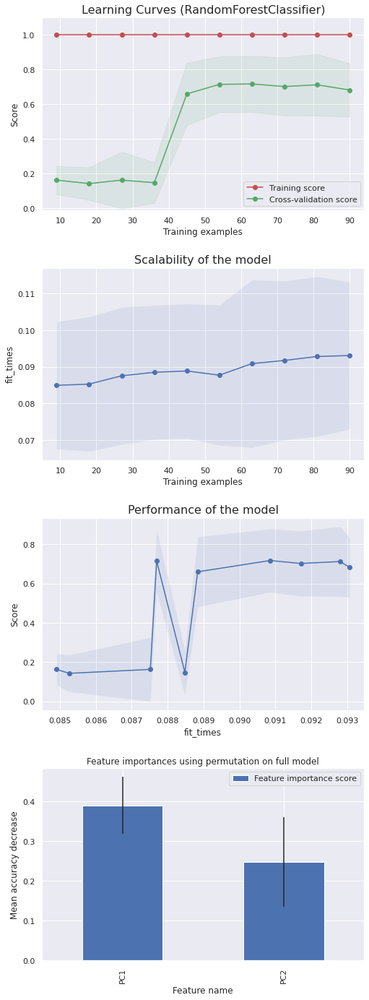




###############################################################----------------------################################################################
##############################################################| ExtraTreesClassifier |###############################################################
###############################################################----------------------################################################################

Corresponding classes to labels : {'CJ': 0, 'HC': 1, 'HFI': 2}

Confusion matrix :


,CJ,HC,HFI
true/pred,,,
CJ,11,0,0
HC,1,1,1
HFI,1,1,3



Classification report :


,precision,recall,f1-score,support
CJ,0.85,1.00,0.92,11.00
HC,0.50,0.33,0.40,3.00
HFI,0.75,0.60,0.67,5.00
accuracy,0.79,0.79,0.79,0.79
macro avg,0.70,0.64,0.66,19.00
weighted avg,0.77,0.79,0.77,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 16 members, which is less than n_splits=20.



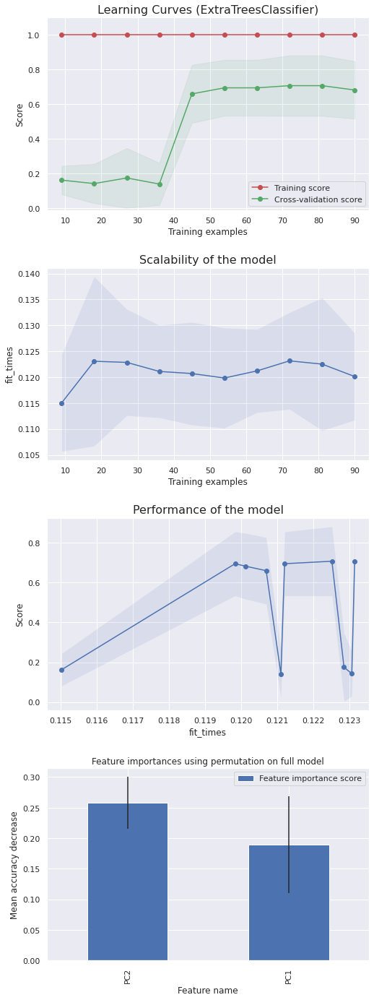




################################################################--------------------#################################################################
###############################################################| AdaBoostClassifier |################################################################
################################################################--------------------#################################################################

Corresponding classes to labels : {'CJ': 0, 'HC': 1, 'HFI': 2}

Confusion matrix :


,CJ,HC,HFI
true/pred,,,
CJ,11,0,0
HC,0,1,2
HFI,1,2,2



Classification report :


,precision,recall,f1-score,support
CJ,0.92,1.00,0.96,11.00
HC,0.33,0.33,0.33,3.00
HFI,0.50,0.40,0.44,5.00
accuracy,0.74,0.74,0.74,0.74
macro avg,0.58,0.58,0.58,19.00
weighted avg,0.71,0.74,0.72,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 16 members, which is less than n_splits=20.



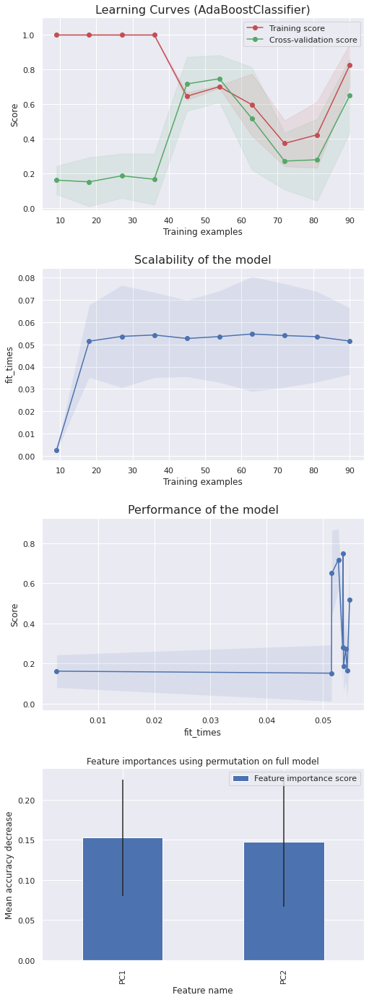




############################################################----------------------------#############################################################
###########################################################| GradientBoostingClassifier |############################################################
############################################################----------------------------#############################################################

Corresponding classes to labels : {'CJ': 0, 'HC': 1, 'HFI': 2}

Confusion matrix :


,CJ,HC,HFI
true/pred,,,
CJ,11,0,0
HC,0,1,2
HFI,1,1,3



Classification report :


,precision,recall,f1-score,support
CJ,0.92,1.00,0.96,11.00
HC,0.50,0.33,0.40,3.00
HFI,0.60,0.60,0.60,5.00
accuracy,0.79,0.79,0.79,0.79
macro avg,0.67,0.64,0.65,19.00
weighted avg,0.77,0.79,0.77,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 16 members, which is less than n_splits=20.



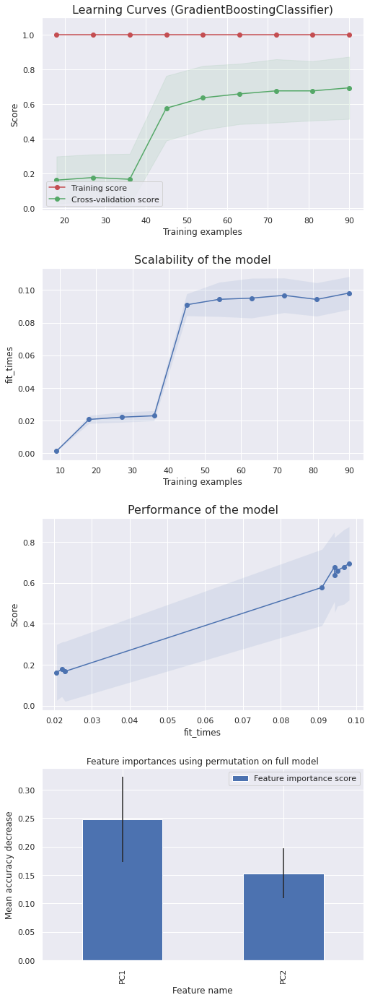




##########################################################--------------------------------###########################################################
#########################################################| HistGradientBoostingClassifier |##########################################################
##########################################################--------------------------------###########################################################

Corresponding classes to labels : {'CJ': 0, 'HC': 1, 'HFI': 2}

Confusion matrix :


,CJ,HC,HFI
true/pred,,,
CJ,11,0,0
HC,0,1,2
HFI,0,0,5



Classification report :


,precision,recall,f1-score,support
CJ,1.00,1.00,1.00,11.00
HC,1.00,0.33,0.50,3.00
HFI,0.71,1.00,0.83,5.00
accuracy,0.89,0.89,0.89,0.89
macro avg,0.90,0.78,0.78,19.00
weighted avg,0.92,0.89,0.88,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 16 members, which is less than n_splits=20.



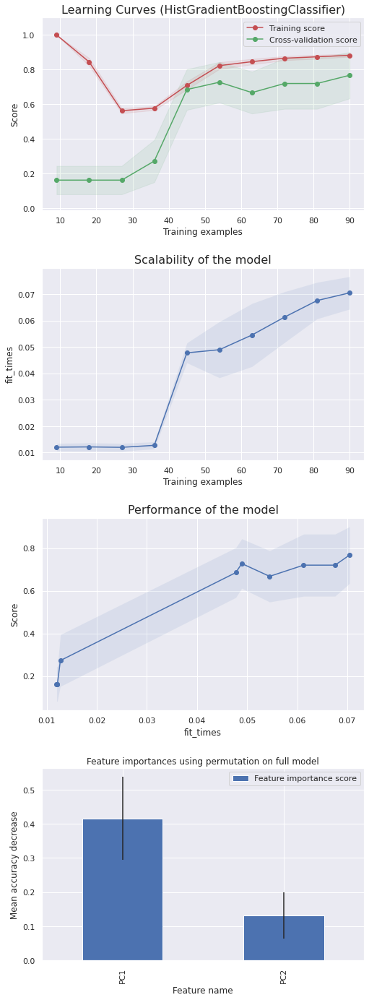




##################################################################---------------####################################################################
#################################################################| MLPClassifier |###################################################################
##################################################################---------------####################################################################

Corresponding classes to labels : {'CJ': 0, 'HC': 1, 'HFI': 2}

Confusion matrix :


/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning:

lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html



,CJ,HC,HFI
true/pred,,,
CJ,0,0,11
HC,0,0,3
HFI,0,0,5



Classification report :


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



,precision,recall,f1-score,support
CJ,0.00,0.00,0.00,11.00
HC,0.00,0.00,0.00,3.00
HFI,0.26,1.00,0.42,5.00
accuracy,0.26,0.26,0.26,0.26
macro avg,0.09,0.33,0.14,19.00
weighted avg,0.07,0.26,0.11,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 16 members, which is less than n_splits=20.

/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/conda/lib/python3.10/site

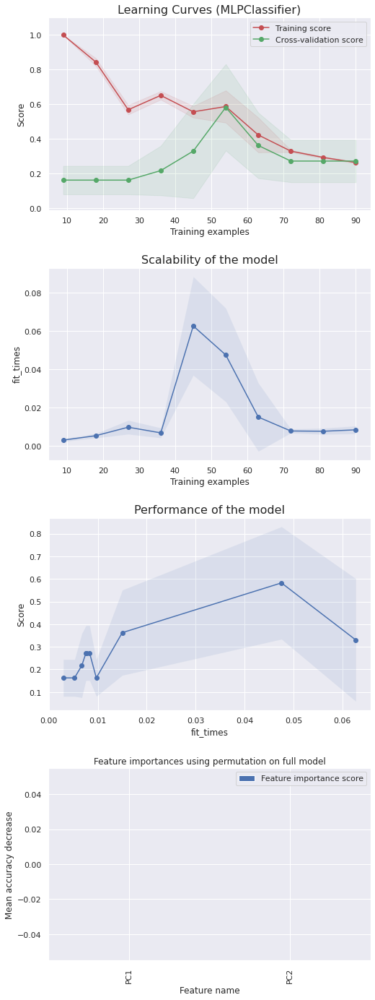




###################################################################################################################################################### 



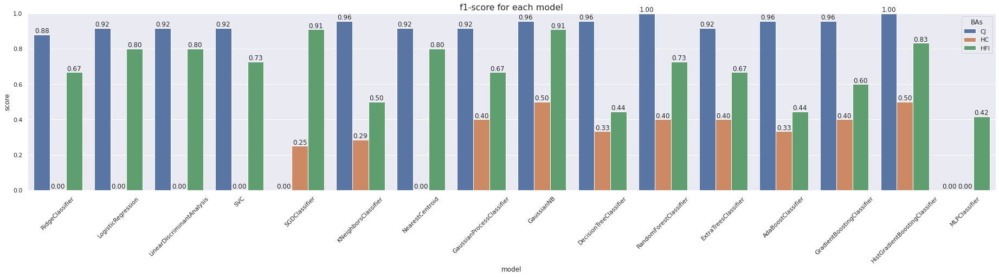


 ######################################################################################################################################################

Time to compute : 00h00m45s

 ######################################################################################################################################################






In [56]:
# Initialise models
RidgeClassifier_ = RidgeClassifier()
LogisticRegression_ = LogisticRegression()
LinearDiscriminantAnalysis_ = LinearDiscriminantAnalysis()
SVC_ = SVC(random_state=0)
SGDClassifier_ = SGDClassifier()
KNeighborsClassifier_ = KNeighborsClassifier()
NearestCentroid_ = NearestCentroid()
GaussianProcessClassifier_ = GaussianProcessClassifier(kernel=1.0 * RBF(1.0))
GaussianNB_ = GaussianNB()
DecisionTreeClassifier_ = DecisionTreeClassifier(random_state=0)
RandomForestClassifier_ = RandomForestClassifier(random_state=0)
ExtraTreesClassifier_ = ExtraTreesClassifier(random_state=0)
AdaBoostClassifier_ = AdaBoostClassifier(random_state=0)
GradientBoostingClassifier_ = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1, random_state=0)
HistGradientBoostingClassifier_ = HistGradientBoostingClassifier(max_iter=100)
MLPClassifier_ = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5, 2), max_iter=300, random_state=1)


# Create dict with all models
dict_models = {'RidgeClassifier': RidgeClassifier_,
               'LogisticRegression': LogisticRegression_,
               'LinearDiscriminantAnalysis': LinearDiscriminantAnalysis_,
               'SVC': SVC_,
               'SGDClassifier': SGDClassifier_,
               'KNeighborsClassifier': KNeighborsClassifier_,
               'NearestCentroid': NearestCentroid_,
               'GaussianProcessClassifier': GaussianProcessClassifier_,
               'GaussianNB': GaussianNB_,
               'DecisionTreeClassifier': DecisionTreeClassifier_,
               'RandomForestClassifier': RandomForestClassifier_,
               'ExtraTreesClassifier': ExtraTreesClassifier_,
               'AdaBoostClassifier': AdaBoostClassifier_,
               'GradientBoostingClassifier': GradientBoostingClassifier_,
               'HistGradientBoostingClassifier': HistGradientBoostingClassifier_,
               'MLPClassifier': MLPClassifier_
              }


# Launch classification pipeline
df_scores, dict_df_feature_importance = pipeline_classification(X=X_imp_halfmin_PCA, y=target,
                                                                dict_models=dict_models, plot_each_model=True, plot_hist_score=True, 
                                                                score='f1-score', cv=20, train_size=0.7, test_size=0.3)

In [57]:
print()

### with <code>X_imp_halfmin_fs_nb_10</code>

#################################################################-----------------###################################################################
################################################################| RidgeClassifier |##################################################################
#################################################################-----------------###################################################################

Corresponding classes to labels : {'CJ': 0, 'HC': 1, 'HFI': 2}

Confusion matrix :


,CJ,HC,HFI
true/pred,,,
CJ,11,0,0
HC,0,2,1
HFI,0,2,3



Classification report :


,precision,recall,f1-score,support
CJ,1.00,1.00,1.00,11.00
HC,0.50,0.67,0.57,3.00
HFI,0.75,0.60,0.67,5.00
accuracy,0.84,0.84,0.84,0.84
macro avg,0.75,0.76,0.75,19.00
weighted avg,0.86,0.84,0.84,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 16 members, which is less than n_splits=20.



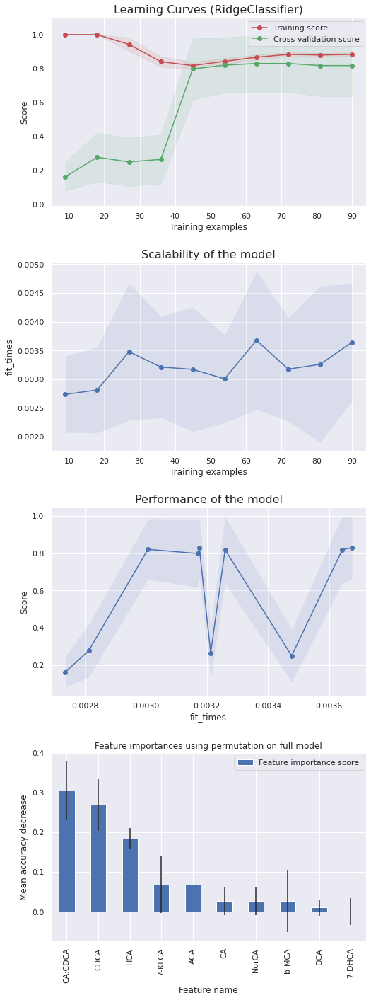




################################################################--------------------#################################################################
###############################################################| LogisticRegression |################################################################
################################################################--------------------#################################################################

Corresponding classes to labels : {'CJ': 0, 'HC': 1, 'HFI': 2}

Confusion matrix :


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



,CJ,HC,HFI
true/pred,,,
CJ,11,0,0
HC,1,1,1
HFI,0,2,3



Classification report :


,precision,recall,f1-score,support
CJ,0.92,1.00,0.96,11.00
HC,0.33,0.33,0.33,3.00
HFI,0.75,0.60,0.67,5.00
accuracy,0.79,0.79,0.79,0.79
macro avg,0.67,0.64,0.65,19.00
weighted avg,0.78,0.79,0.78,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 16 members, which is less than n_splits=20.

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preproces

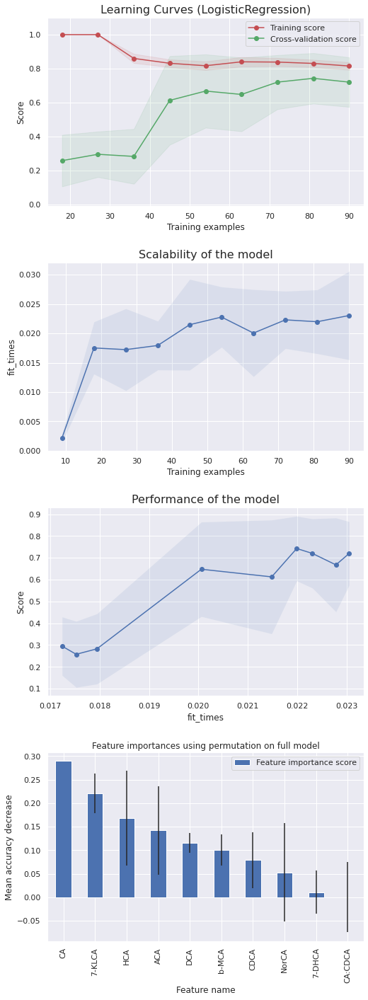




############################################################----------------------------#############################################################
###########################################################| LinearDiscriminantAnalysis |############################################################
############################################################----------------------------#############################################################

Corresponding classes to labels : {'CJ': 0, 'HC': 1, 'HFI': 2}

Confusion matrix :


,CJ,HC,HFI
true/pred,,,
CJ,11,0,0
HC,0,2,1
HFI,0,2,3



Classification report :


,precision,recall,f1-score,support
CJ,1.00,1.00,1.00,11.00
HC,0.50,0.67,0.57,3.00
HFI,0.75,0.60,0.67,5.00
accuracy,0.84,0.84,0.84,0.84
macro avg,0.75,0.76,0.75,19.00
weighted avg,0.86,0.84,0.84,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 16 members, which is less than n_splits=20.



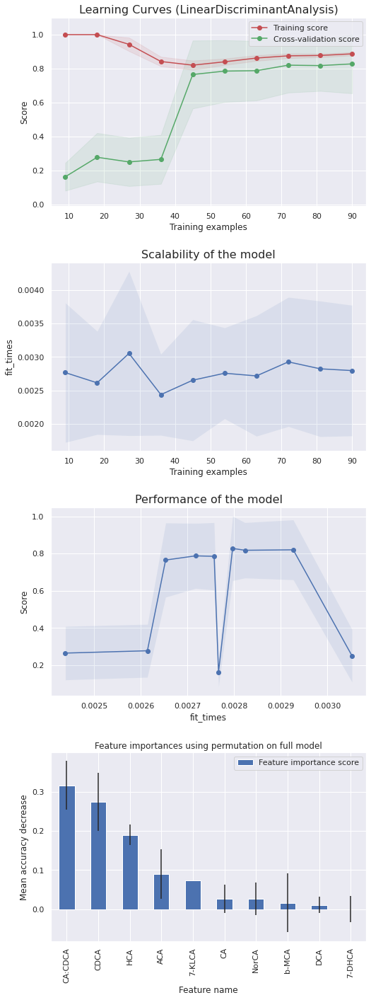




#######################################################################-----#########################################################################
######################################################################| SVC |########################################################################
#######################################################################-----#########################################################################

Corresponding classes to labels : {'CJ': 0, 'HC': 1, 'HFI': 2}

Confusion matrix :


,CJ,HC,HFI
true/pred,,,
CJ,11,0,0
HC,1,0,2
HFI,0,0,5



Classification report :


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



,precision,recall,f1-score,support
CJ,0.92,1.00,0.96,11.00
HC,0.00,0.00,0.00,3.00
HFI,0.71,1.00,0.83,5.00
accuracy,0.84,0.84,0.84,0.84
macro avg,0.54,0.67,0.60,19.00
weighted avg,0.72,0.84,0.77,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 16 members, which is less than n_splits=20.



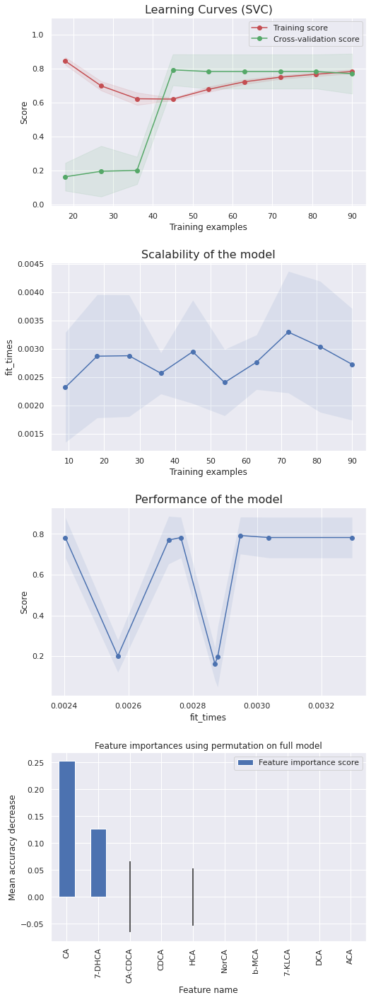




##################################################################---------------####################################################################
#################################################################| SGDClassifier |###################################################################
##################################################################---------------####################################################################

Corresponding classes to labels : {'CJ': 0, 'HC': 1, 'HFI': 2}

Confusion matrix :


,CJ,HC,HFI
true/pred,,,
CJ,5,0,6
HC,1,0,2
HFI,0,0,5



Classification report :


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



,precision,recall,f1-score,support
CJ,0.83,0.45,0.59,11.00
HC,0.00,0.00,0.00,3.00
HFI,0.38,1.00,0.56,5.00
accuracy,0.53,0.53,0.53,0.53
macro avg,0.41,0.48,0.38,19.00
weighted avg,0.58,0.53,0.49,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 16 members, which is less than n_splits=20.



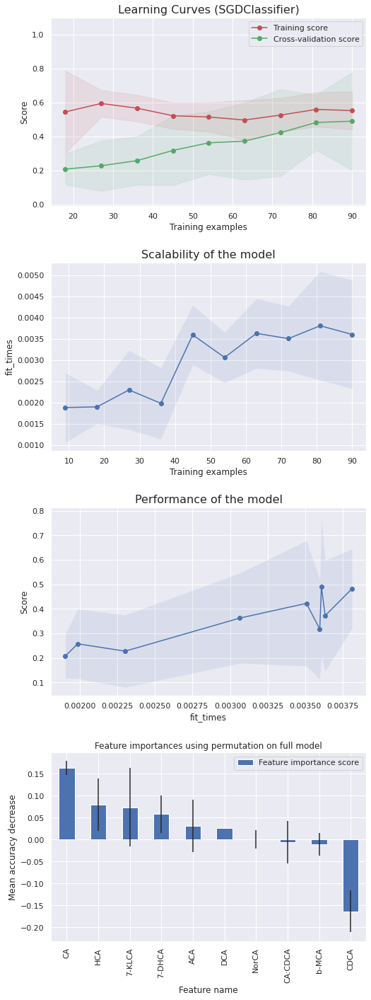




###############################################################----------------------################################################################
##############################################################| KNeighborsClassifier |###############################################################
###############################################################----------------------################################################################

Corresponding classes to labels : {'CJ': 0, 'HC': 1, 'HFI': 2}

Confusion matrix :


,CJ,HC,HFI
true/pred,,,
CJ,11,0,0
HC,1,1,1
HFI,0,2,3



Classification report :


,precision,recall,f1-score,support
CJ,0.92,1.00,0.96,11.00
HC,0.33,0.33,0.33,3.00
HFI,0.75,0.60,0.67,5.00
accuracy,0.79,0.79,0.79,0.79
macro avg,0.67,0.64,0.65,19.00
weighted avg,0.78,0.79,0.78,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 16 members, which is less than n_splits=20.



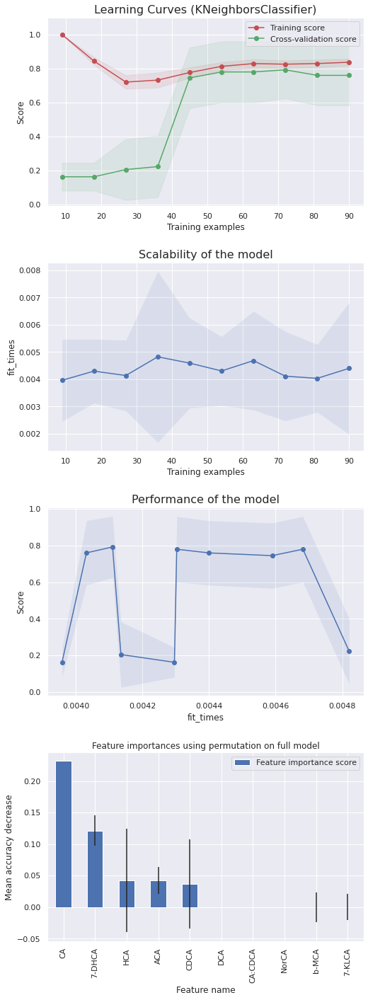




#################################################################-----------------###################################################################
################################################################| NearestCentroid |##################################################################
#################################################################-----------------###################################################################

Corresponding classes to labels : {'CJ': 0, 'HC': 1, 'HFI': 2}

Confusion matrix :


,CJ,HC,HFI
true/pred,,,
CJ,11,0,0
HC,2,0,1
HFI,0,1,4



Classification report :


,precision,recall,f1-score,support
CJ,0.85,1.00,0.92,11.00
HC,0.00,0.00,0.00,3.00
HFI,0.80,0.80,0.80,5.00
accuracy,0.79,0.79,0.79,0.79
macro avg,0.55,0.60,0.57,19.00
weighted avg,0.70,0.79,0.74,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 16 members, which is less than n_splits=20.



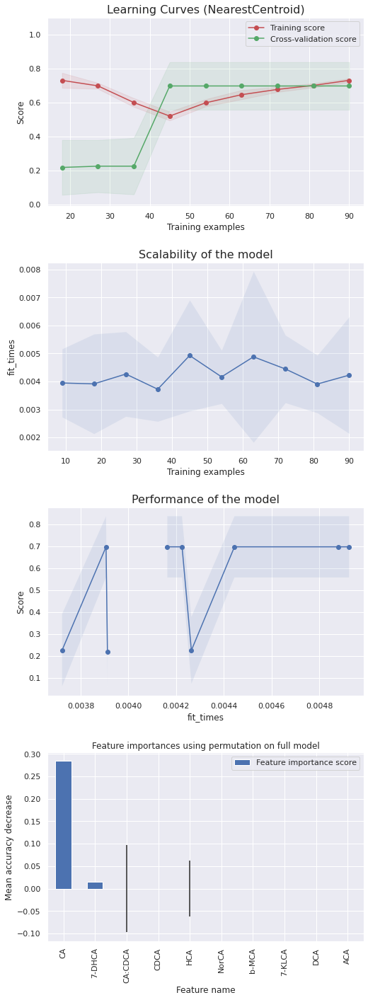




############################################################---------------------------##############################################################
###########################################################| GaussianProcessClassifier |#############################################################
############################################################---------------------------##############################################################

Corresponding classes to labels : {'CJ': 0, 'HC': 1, 'HFI': 2}

Confusion matrix :


,CJ,HC,HFI
true/pred,,,
CJ,11,0,0
HC,1,1,1
HFI,1,2,2



Classification report :


,precision,recall,f1-score,support
CJ,0.85,1.00,0.92,11.00
HC,0.33,0.33,0.33,3.00
HFI,0.67,0.40,0.50,5.00
accuracy,0.74,0.74,0.74,0.74
macro avg,0.62,0.58,0.58,19.00
weighted avg,0.72,0.74,0.71,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 16 members, which is less than n_splits=20.

/opt/conda/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/gaussian_process/_gpc.py:472: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/opt/conda/lib/python3.10/site-packages/sklearn/gaussian_process/_gpc.py:472: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

I

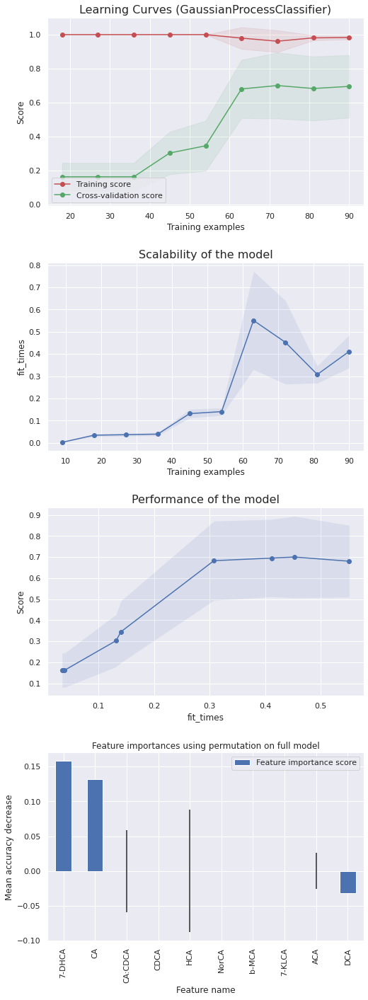




####################################################################------------#####################################################################
###################################################################| GaussianNB |####################################################################
####################################################################------------#####################################################################

Corresponding classes to labels : {'CJ': 0, 'HC': 1, 'HFI': 2}

Confusion matrix :


,CJ,HC,HFI
true/pred,,,
CJ,11,0,0
HC,0,0,3
HFI,0,2,3



Classification report :


,precision,recall,f1-score,support
CJ,1.00,1.00,1.00,11.00
HC,0.00,0.00,0.00,3.00
HFI,0.50,0.60,0.55,5.00
accuracy,0.74,0.74,0.74,0.74
macro avg,0.50,0.53,0.52,19.00
weighted avg,0.71,0.74,0.72,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 16 members, which is less than n_splits=20.



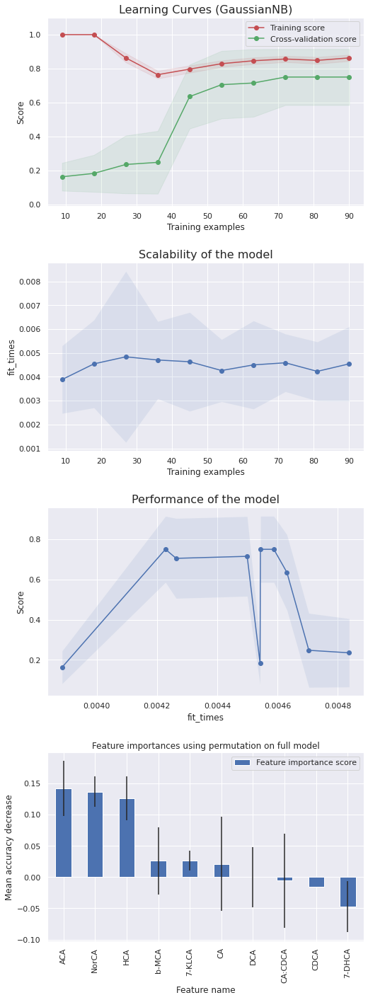




##############################################################------------------------###############################################################
#############################################################| DecisionTreeClassifier |##############################################################
##############################################################------------------------###############################################################

Corresponding classes to labels : {'CJ': 0, 'HC': 1, 'HFI': 2}

Confusion matrix :


,CJ,HC,HFI
true/pred,,,
CJ,11,0,0
HC,1,2,0
HFI,2,1,2



Classification report :


,precision,recall,f1-score,support
CJ,0.79,1.00,0.88,11.00
HC,0.67,0.67,0.67,3.00
HFI,1.00,0.40,0.57,5.00
accuracy,0.79,0.79,0.79,0.79
macro avg,0.82,0.69,0.71,19.00
weighted avg,0.82,0.79,0.77,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 16 members, which is less than n_splits=20.



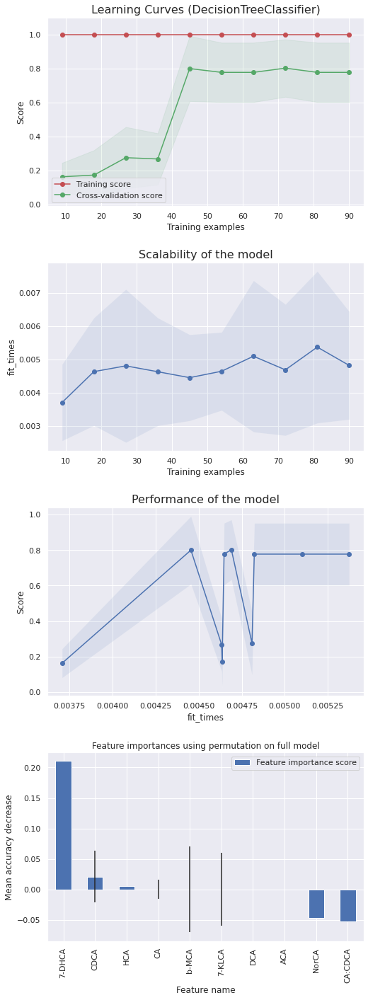




##############################################################------------------------###############################################################
#############################################################| RandomForestClassifier |##############################################################
##############################################################------------------------###############################################################

Corresponding classes to labels : {'CJ': 0, 'HC': 1, 'HFI': 2}

Confusion matrix :


,CJ,HC,HFI
true/pred,,,
CJ,11,0,0
HC,0,1,2
HFI,0,1,4



Classification report :


,precision,recall,f1-score,support
CJ,1.00,1.00,1.00,11.00
HC,0.50,0.33,0.40,3.00
HFI,0.67,0.80,0.73,5.00
accuracy,0.84,0.84,0.84,0.84
macro avg,0.72,0.71,0.71,19.00
weighted avg,0.83,0.84,0.83,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 16 members, which is less than n_splits=20.



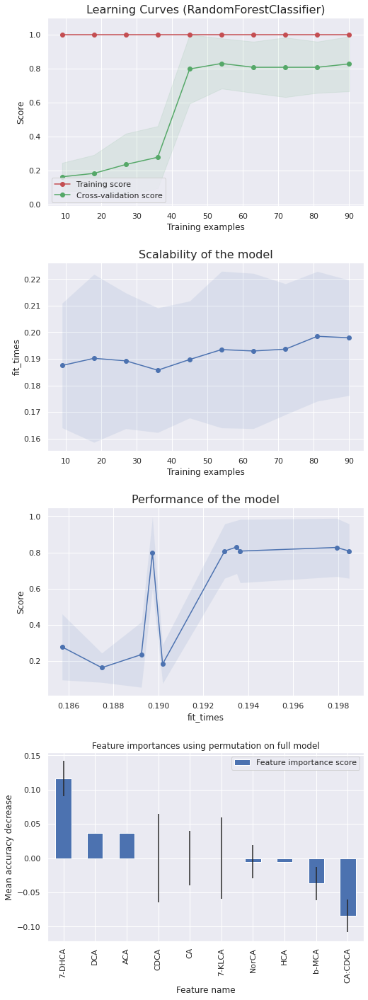




###############################################################----------------------################################################################
##############################################################| ExtraTreesClassifier |###############################################################
###############################################################----------------------################################################################

Corresponding classes to labels : {'CJ': 0, 'HC': 1, 'HFI': 2}

Confusion matrix :


,CJ,HC,HFI
true/pred,,,
CJ,11,0,0
HC,0,2,1
HFI,0,2,3



Classification report :


,precision,recall,f1-score,support
CJ,1.00,1.00,1.00,11.00
HC,0.50,0.67,0.57,3.00
HFI,0.75,0.60,0.67,5.00
accuracy,0.84,0.84,0.84,0.84
macro avg,0.75,0.76,0.75,19.00
weighted avg,0.86,0.84,0.84,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 16 members, which is less than n_splits=20.



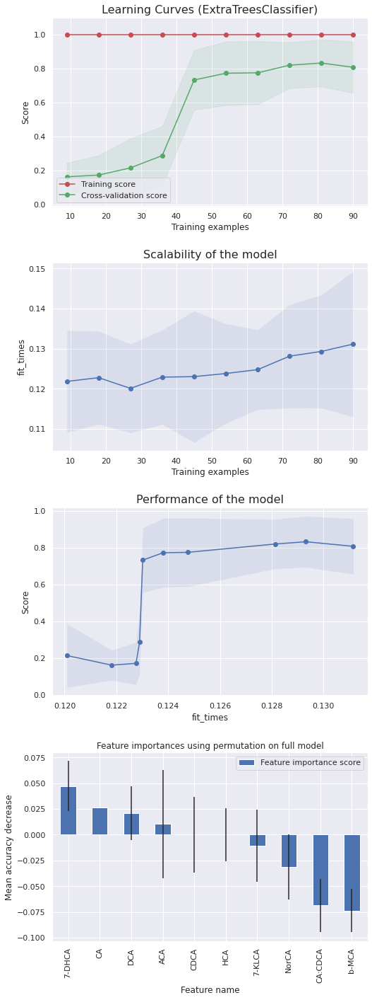




################################################################--------------------#################################################################
###############################################################| AdaBoostClassifier |################################################################
################################################################--------------------#################################################################

Corresponding classes to labels : {'CJ': 0, 'HC': 1, 'HFI': 2}

Confusion matrix :


,CJ,HC,HFI
true/pred,,,
CJ,11,0,0
HC,0,2,1
HFI,0,3,2



Classification report :


,precision,recall,f1-score,support
CJ,1.00,1.00,1.00,11.00
HC,0.40,0.67,0.50,3.00
HFI,0.67,0.40,0.50,5.00
accuracy,0.79,0.79,0.79,0.79
macro avg,0.69,0.69,0.67,19.00
weighted avg,0.82,0.79,0.79,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 16 members, which is less than n_splits=20.



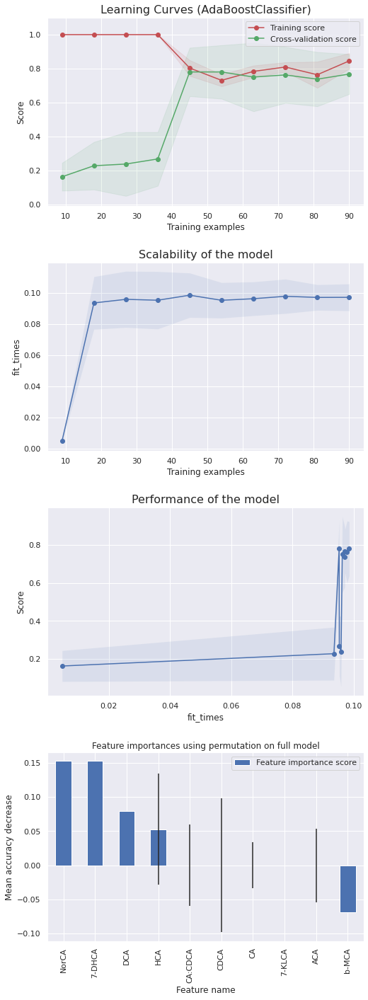




############################################################----------------------------#############################################################
###########################################################| GradientBoostingClassifier |############################################################
############################################################----------------------------#############################################################

Corresponding classes to labels : {'CJ': 0, 'HC': 1, 'HFI': 2}

Confusion matrix :


,CJ,HC,HFI
true/pred,,,
CJ,11,0,0
HC,0,1,2
HFI,0,4,1



Classification report :


,precision,recall,f1-score,support
CJ,1.00,1.00,1.00,11.00
HC,0.20,0.33,0.25,3.00
HFI,0.33,0.20,0.25,5.00
accuracy,0.68,0.68,0.68,0.68
macro avg,0.51,0.51,0.50,19.00
weighted avg,0.70,0.68,0.68,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 16 members, which is less than n_splits=20.



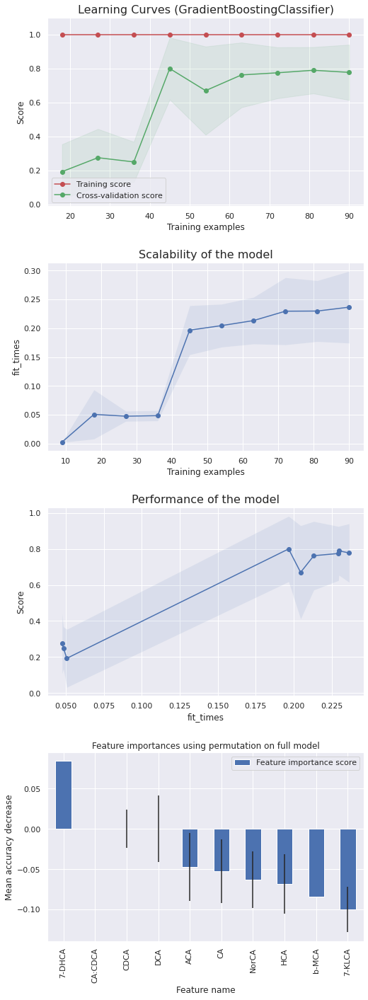




##########################################################--------------------------------###########################################################
#########################################################| HistGradientBoostingClassifier |##########################################################
##########################################################--------------------------------###########################################################

Corresponding classes to labels : {'CJ': 0, 'HC': 1, 'HFI': 2}

Confusion matrix :


,CJ,HC,HFI
true/pred,,,
CJ,11,0,0
HC,0,3,0
HFI,1,2,2



Classification report :


,precision,recall,f1-score,support
CJ,0.92,1.00,0.96,11.00
HC,0.60,1.00,0.75,3.00
HFI,1.00,0.40,0.57,5.00
accuracy,0.84,0.84,0.84,0.84
macro avg,0.84,0.80,0.76,19.00
weighted avg,0.89,0.84,0.82,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 16 members, which is less than n_splits=20.



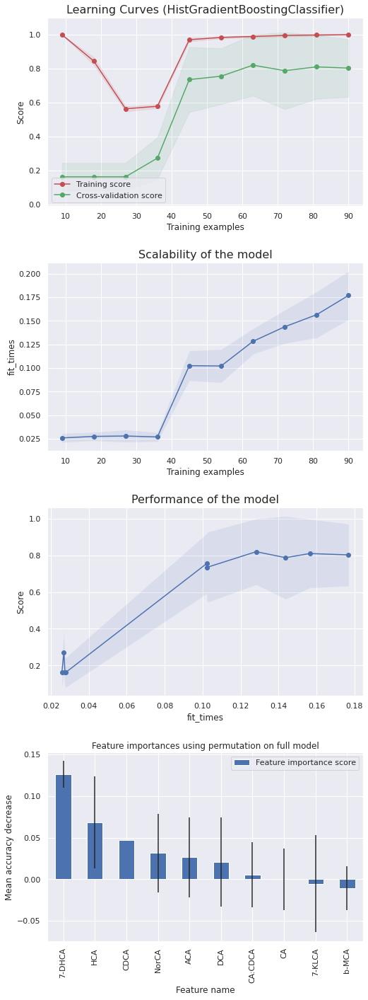




##################################################################---------------####################################################################
#################################################################| MLPClassifier |###################################################################
##################################################################---------------####################################################################

Corresponding classes to labels : {'CJ': 0, 'HC': 1, 'HFI': 2}

Confusion matrix :


,CJ,HC,HFI
true/pred,,,
CJ,11,0,0
HC,1,0,2
HFI,0,0,5



Classification report :


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



,precision,recall,f1-score,support
CJ,0.92,1.00,0.96,11.00
HC,0.00,0.00,0.00,3.00
HFI,0.71,1.00,0.83,5.00
accuracy,0.84,0.84,0.84,0.84
macro avg,0.54,0.67,0.60,19.00
weighted avg,0.72,0.84,0.77,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 16 members, which is less than n_splits=20.

/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/conda/lib/python3.10/site

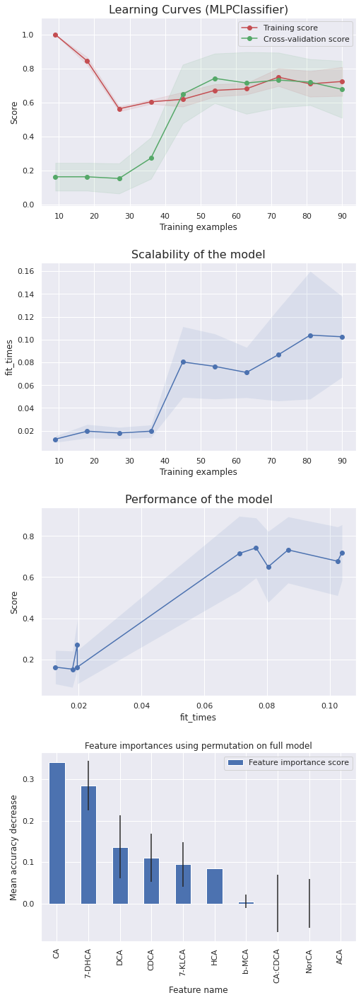




###################################################################################################################################################### 



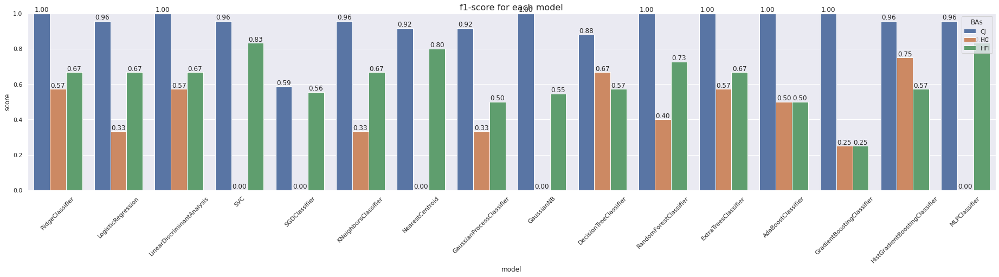


 ######################################################################################################################################################

Time to compute : 00h01m28s

 ######################################################################################################################################################






In [58]:
# Initialise models
RidgeClassifier_ = RidgeClassifier()
LogisticRegression_ = LogisticRegression()
LinearDiscriminantAnalysis_ = LinearDiscriminantAnalysis()
SVC_ = SVC(random_state=0)
SGDClassifier_ = SGDClassifier()
KNeighborsClassifier_ = KNeighborsClassifier()
NearestCentroid_ = NearestCentroid()
GaussianProcessClassifier_ = GaussianProcessClassifier(kernel=1.0 * RBF(1.0))
GaussianNB_ = GaussianNB()
DecisionTreeClassifier_ = DecisionTreeClassifier(random_state=0)
RandomForestClassifier_ = RandomForestClassifier(random_state=0)
ExtraTreesClassifier_ = ExtraTreesClassifier(random_state=0)
AdaBoostClassifier_ = AdaBoostClassifier(random_state=0)
GradientBoostingClassifier_ = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1, random_state=0)
HistGradientBoostingClassifier_ = HistGradientBoostingClassifier(max_iter=100)
MLPClassifier_ = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5, 2), max_iter=300, random_state=1)


# Create dict with all models
dict_models = {'RidgeClassifier': RidgeClassifier_,
               'LogisticRegression': LogisticRegression_,
               'LinearDiscriminantAnalysis': LinearDiscriminantAnalysis_,
               'SVC': SVC_,
               'SGDClassifier': SGDClassifier_,
               'KNeighborsClassifier': KNeighborsClassifier_,
               'NearestCentroid': NearestCentroid_,
               'GaussianProcessClassifier': GaussianProcessClassifier_,
               'GaussianNB': GaussianNB_,
               'DecisionTreeClassifier': DecisionTreeClassifier_,
               'RandomForestClassifier': RandomForestClassifier_,
               'ExtraTreesClassifier': ExtraTreesClassifier_,
               'AdaBoostClassifier': AdaBoostClassifier_,
               'GradientBoostingClassifier': GradientBoostingClassifier_,
               'HistGradientBoostingClassifier': HistGradientBoostingClassifier_,
               'MLPClassifier': MLPClassifier_
              }


# Launch classification pipeline
df_scores, dict_df_feature_importance = pipeline_classification(X=X_imp_halfmin_fs_nb_10, y=target,
                                                                dict_models=dict_models, plot_each_model=True, plot_hist_score=True, 
                                                                score='f1-score', cv=20, train_size=0.7, test_size=0.3)

In [59]:
print()

### with <code>X_imp_halfmin_fs_nb_5</code>

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/c

###################################################################################################################################################### 



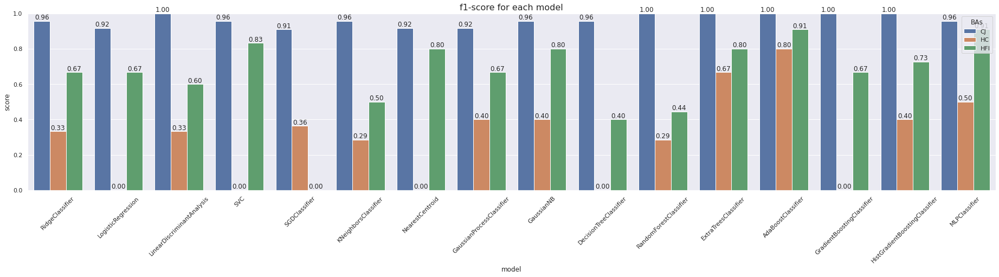


 ######################################################################################################################################################

Time to compute : 00h00m06s

 ######################################################################################################################################################






In [60]:
# Initialise models
RidgeClassifier_ = RidgeClassifier()
LogisticRegression_ = LogisticRegression()
LinearDiscriminantAnalysis_ = LinearDiscriminantAnalysis()
SVC_ = SVC(random_state=0)
SGDClassifier_ = SGDClassifier()
KNeighborsClassifier_ = KNeighborsClassifier()
NearestCentroid_ = NearestCentroid()
GaussianProcessClassifier_ = GaussianProcessClassifier(kernel=1.0 * RBF(1.0))
GaussianNB_ = GaussianNB()
DecisionTreeClassifier_ = DecisionTreeClassifier(random_state=0)
RandomForestClassifier_ = RandomForestClassifier(random_state=0)
ExtraTreesClassifier_ = ExtraTreesClassifier(random_state=0)
AdaBoostClassifier_ = AdaBoostClassifier(random_state=0)
GradientBoostingClassifier_ = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1, random_state=0)
HistGradientBoostingClassifier_ = HistGradientBoostingClassifier(max_iter=100)
MLPClassifier_ = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5, 2), max_iter=300, random_state=1)


# Create dict with all models
dict_models = {'RidgeClassifier': RidgeClassifier_,
               'LogisticRegression': LogisticRegression_,
               'LinearDiscriminantAnalysis': LinearDiscriminantAnalysis_,
               'SVC': SVC_,
               'SGDClassifier': SGDClassifier_,
               'KNeighborsClassifier': KNeighborsClassifier_,
               'NearestCentroid': NearestCentroid_,
               'GaussianProcessClassifier': GaussianProcessClassifier_,
               'GaussianNB': GaussianNB_,
               'DecisionTreeClassifier': DecisionTreeClassifier_,
               'RandomForestClassifier': RandomForestClassifier_,
               'ExtraTreesClassifier': ExtraTreesClassifier_,
               'AdaBoostClassifier': AdaBoostClassifier_,
               'GradientBoostingClassifier': GradientBoostingClassifier_,
               'HistGradientBoostingClassifier': HistGradientBoostingClassifier_,
               'MLPClassifier': MLPClassifier_
              }


# Launch classification pipeline
df_scores, dict_df_feature_importance = pipeline_classification(X=X_imp_halfmin_fs_nb_5, y=target,
                                                                dict_models=dict_models, plot_each_model=False, plot_hist_score=True,
                                                                score='f1-score', cv=10, train_size=0.7, test_size=0.3)

In [61]:
print()

### On the above barplot, we can choose a model and dig into its caracteristics, e.g. *RandomForestClassifier*

In [62]:
df_scores

,RidgeClassifier,LogisticRegression,LinearDiscriminantAnalysis,SVC,SGDClassifier,KNeighborsClassifier,NearestCentroid,GaussianProcessClassifier,GaussianNB,DecisionTreeClassifier,RandomForestClassifier,ExtraTreesClassifier,AdaBoostClassifier,GradientBoostingClassifier,HistGradientBoostingClassifier,MLPClassifier
CJ,0.96,0.92,1.00,0.96,0.91,0.96,0.92,0.92,0.96,0.96,1.00,1.00,1.00,1.00,1.00,0.96
HC,0.33,0.00,0.33,0.00,0.36,0.29,0.00,0.40,0.40,0.00,0.29,0.67,0.80,0.00,0.40,0.50
HFI,0.67,0.67,0.60,0.83,0.00,0.50,0.80,0.67,0.80,0.40,0.44,0.80,0.91,0.67,0.73,0.91


In [63]:
dict_df_feature_importance['DecisionTreeClassifier']

,Feature name,Feature importance score
4,7-DHCA,0.09
2,CA,0.00
1,CDCA,-0.04
0,CA:CDCA,-0.05
3,HCA,-0.06


In [64]:
print()

# 7 - Clustering

In [67]:
from clustering_functions import *

In [68]:
#target = 

## a - Kmeans

/opt/conda/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but KMeans was fitted with feature names



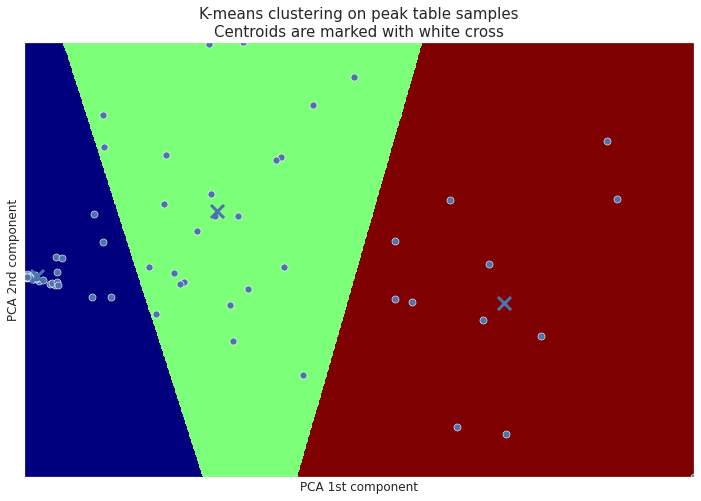

Inertia of k-means model : 40478196.00


In [69]:
kmeans = perform_kmeans(X_imp_halfmin_PCA.astype('double'), n_clusters=3, col_prefix='PCA')

/opt/conda/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but KMeans was fitted with feature names



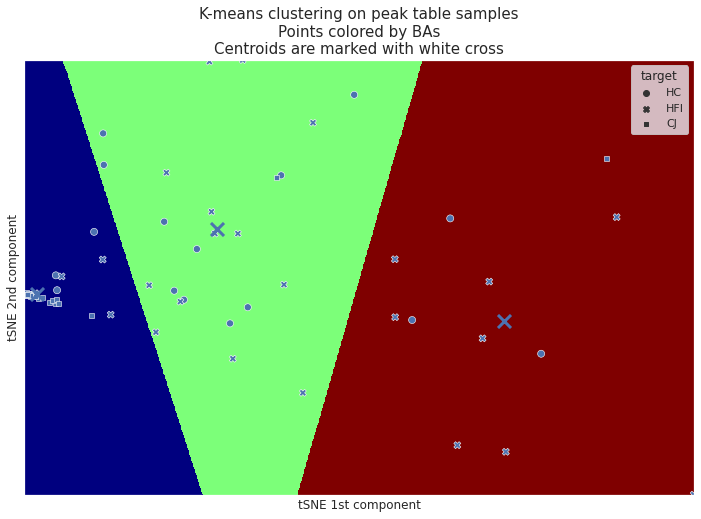

Inertia of k-means model : 40478196.00
Adjusted rand index of k-means model : 0.579


In [70]:
kmeans = perform_kmeans(X_imp_halfmin_PCA.astype('double'), target=target, n_clusters=3, col_prefix='tSNE')

## b - Affinity propagation

/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_affinity_propagation.py:236: ConvergenceWarning:

Affinity propagation did not converge, this model may return degenerate cluster centers and labels.



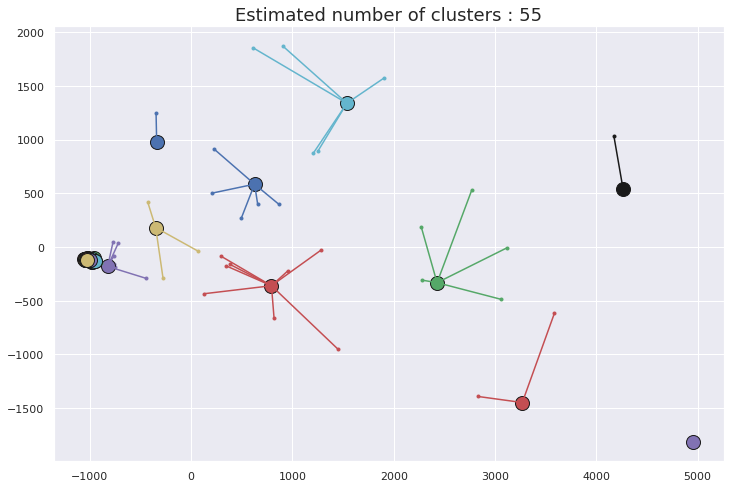

In [71]:
af = perform_affinity_propagation(X_imp_halfmin_PCA)

## c - Hierarchical clustering

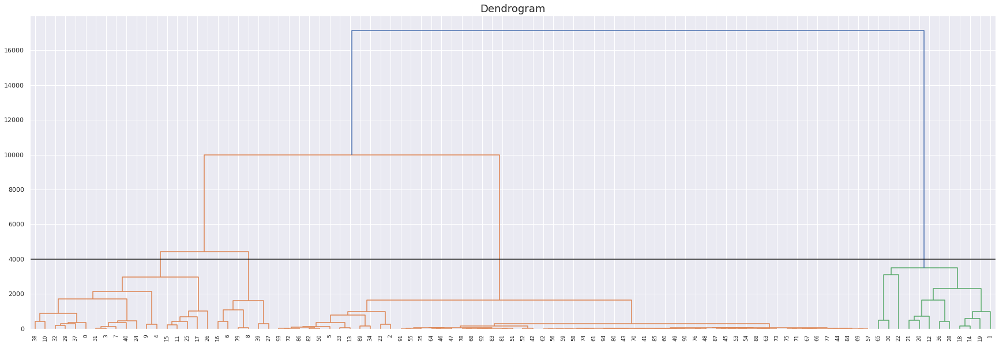

In [72]:
plot_dendrogram(X_imp_halfmin_PCA, hline=4000)

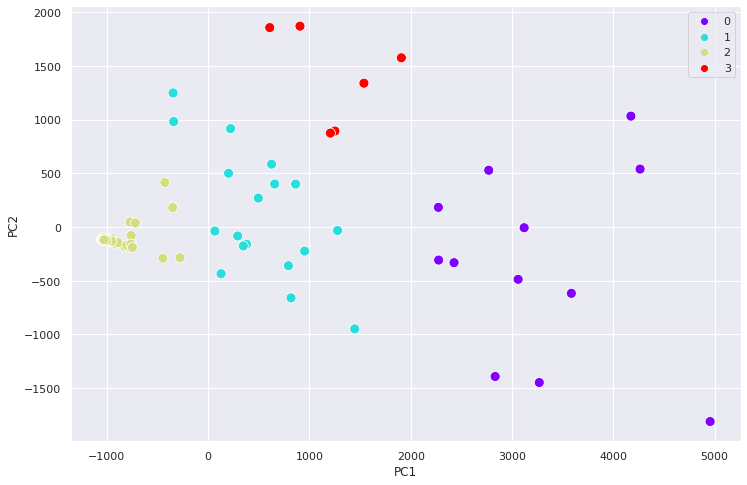

In [73]:
hc = perform_hierarchical_clustering(X_imp_halfmin_PCA, n_clusters=4)

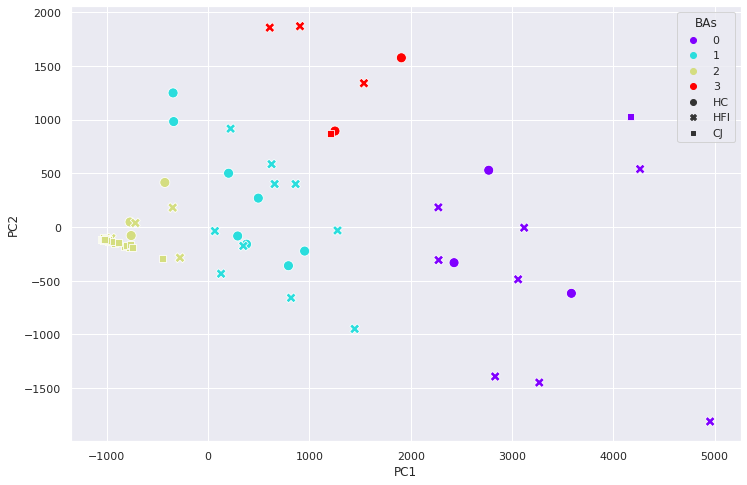

In [74]:
hc = perform_hierarchical_clustering(X_imp_halfmin_PCA, n_clusters=4, target=target)